<a href="https://colab.research.google.com/github/UN-GCPDS/python-gcpds.luker_multiple_annotators/blob/main/notebooks/test_5subset_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Initialization

## Load repo


In [1]:
! git clone https://github.com/UN-GCPDS/python-gcpds.luker_multiple_annotators.git

Cloning into 'python-gcpds.luker_multiple_annotators'...
remote: Enumerating objects: 77, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 77 (delta 17), reused 60 (delta 8), pack-reused 0
Receiving objects: 100% (77/77), 17.72 MiB | 13.29 MiB/s, done.
Resolving deltas: 100% (17/17), done.


In [2]:
%cd "/content/python-gcpds.luker_multiple_annotators"

/content/python-gcpds.luker_multiple_annotators


## Load libraries

In [11]:
import sys
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import pickle
import tensorflow as tf
from scipy.special import softmax

sys.path.append('/content/python-gcpds.luker_multiple_annotators/src')
! pip install umap-learn
from multiple_annotators_models import CKA, LCKA
from utils import *

## Load data

In [4]:
df_sens = pd.read_csv('data/datos_sensoriales.csv', index_col=0)
df_fq = pd.read_csv('data/datos_fisi_quim.csv')
df_comb = df_sens.merge(df_fq, left_on='codigo sampler', right_on='CodMuestra')
df_comb

<ipython-input-4-136c44a6aeb5>:1: DtypeWarning: Columns (4,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.
  df_sens = pd.read_csv('data/datos_sensoriales.csv', index_col=0)


,codigo sampler,hora inicio,hora finalizacion,muestra,codigo evaluador,familia producto,producto,acidez,adherencia,almendra,...,viscosidad aparente ha1 70°c,viscosidad aparente ha7 40°c,viscosidad plastica,viscosidad plastica anton paar,viscosidad plastica brookfield,viscosidad plastica ensayo,viscosidad plastica [duplicado] anton paar,viscosidad plastica [preliminar],viscosidad plastica nca/cma,zaranda <5mm
0,D03221578,2022-04-22 11:06:18,2022-04-22 11:10:32,967.0,160,Dark Chocolate Rutinarios,marcha rich,1.0,NaN,0.0,...,NaN,NaN,NaN,1.8786,NaN,NaN,NaN,NaN,NaN,NaN
1,D03221578,2022-04-22 11:07:58,2022-04-22 11:11:00,967.0,154,Dark Chocolate Rutinarios,match rich,0.0,NaN,0.0,...,NaN,NaN,NaN,1.8786,NaN,NaN,NaN,NaN,NaN,NaN
2,D03221578,2022-04-22 11:10:39,2022-04-22 11:14:52,967.0,967,Dark Chocolate Rutinarios,MATCH RICH,1.0,NaN,0.0,...,NaN,NaN,NaN,1.8786,NaN,NaN,NaN,NaN,NaN,NaN
3,D04221765,2022-04-22 11:10:35,2022-04-22 11:12:07,758.0,160,Dark Chocolate Rutinarios,dark chocolate 70 % organic petitorio,0.0,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,D04221765,2022-04-22 11:11:01,2022-04-22 11:12:13,758.0,154,Dark Chocolate Rutinarios,dark chocolate 70% organic petit,0.0,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13843,Z09230090,2023-09-08 15:14:48,2023-09-08 15:17:05,400,141,Dark Chocolate Rutinarios,Fark mango,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13844,Z09230090,2023-09-08 19:42:12,2023-09-08 19:45:45,400,101,Dark Chocolate Rutinarios,Dark mango,3.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13845,Z09230091,2023-09-08 13:54:15,2023-09-08 13:57:35,111,169,Dark Chocolate Rutinarios,Piña,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13846,Z09230091,2023-09-08 15:11:49,2023-09-08 15:16:27,111,101,Dark Chocolate Rutinarios,111,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Definition of subsets

In [5]:
fq_variables = ['granulometría - micrometro', 'grasa - nmr', 'humedad - determinador halogeno', 'limite de fluidez  anton paar', 'viscosidad plastica  anton paar']
variables = ['aroma', 'dulce', 'amargor', 'acidez', 'astringencia', 'velocidad fusion']
lista_ann = ['135', '154', '155', '160', '179']

# Models

***********************************aroma***********************************


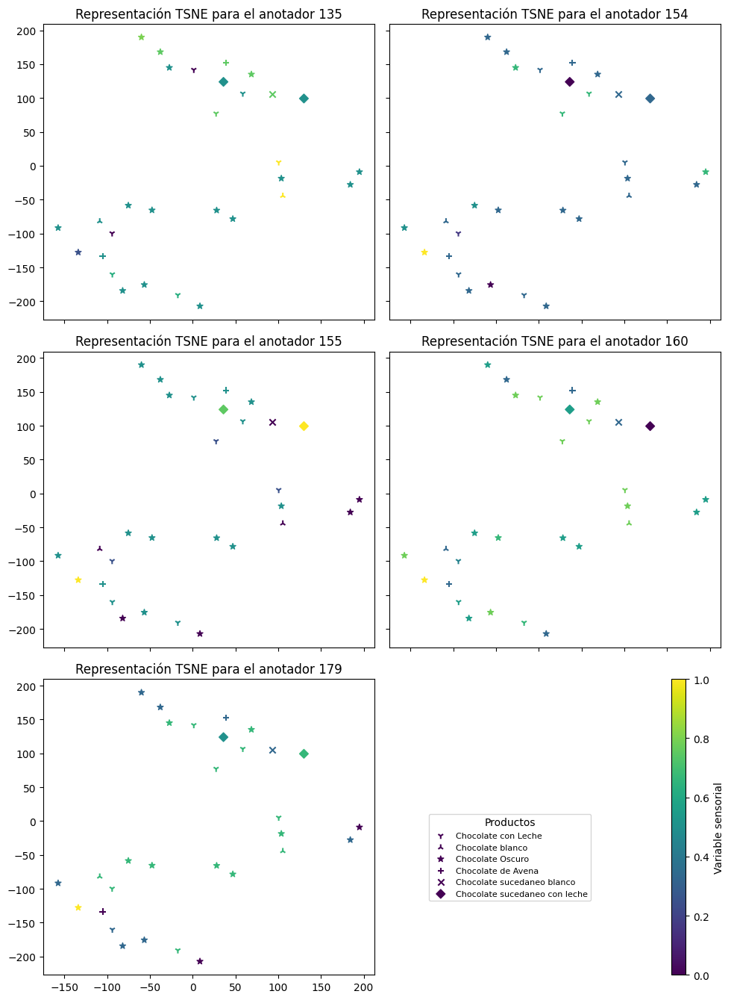

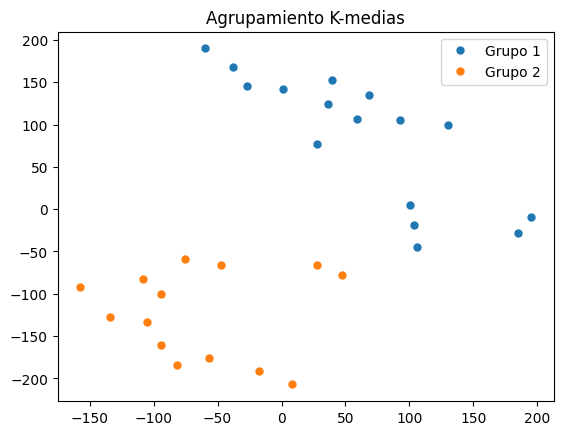

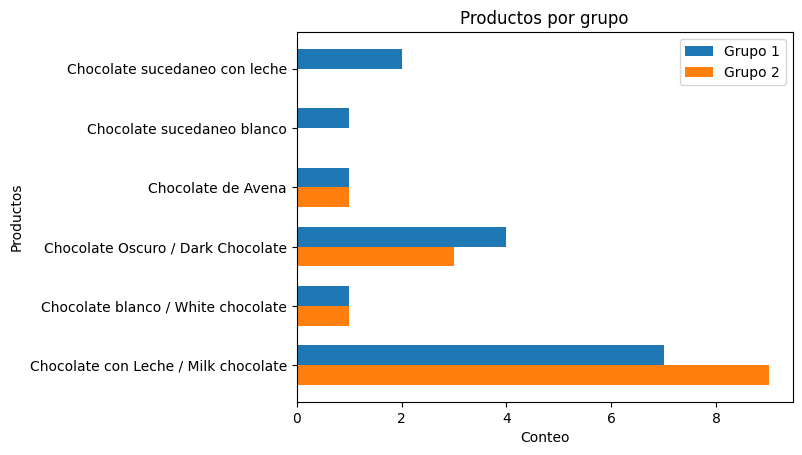

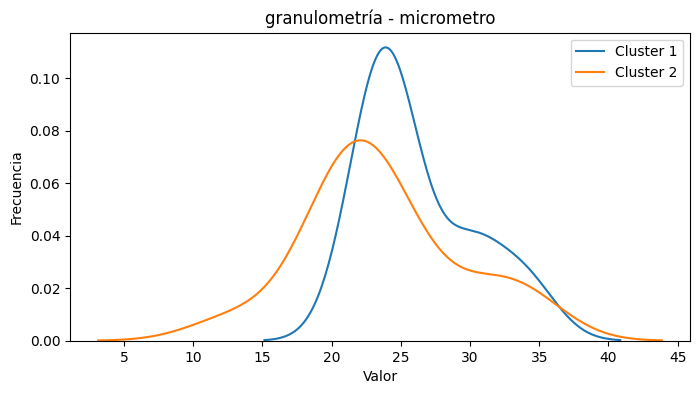

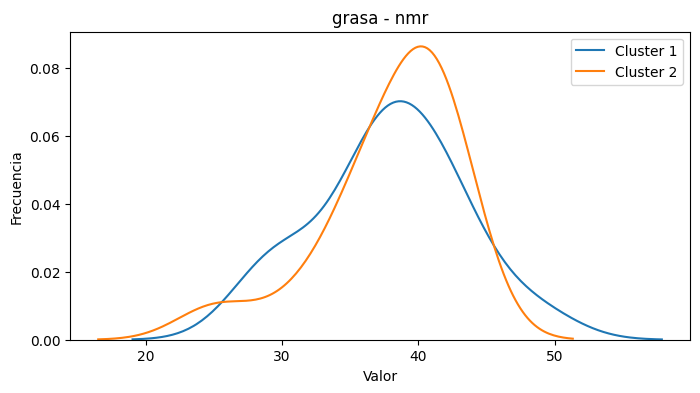

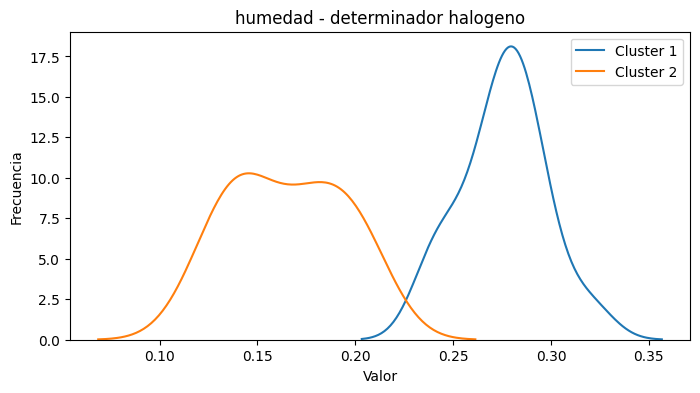

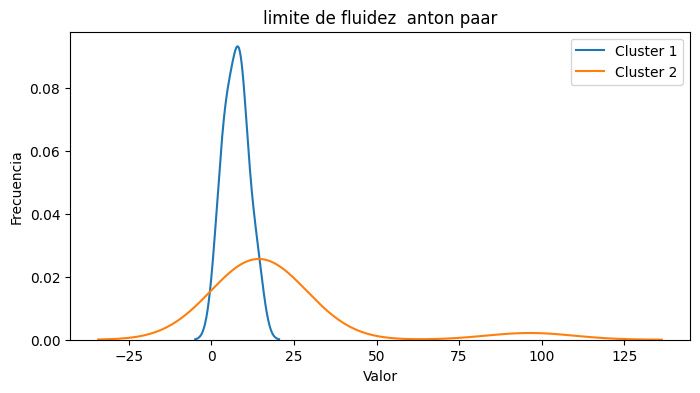

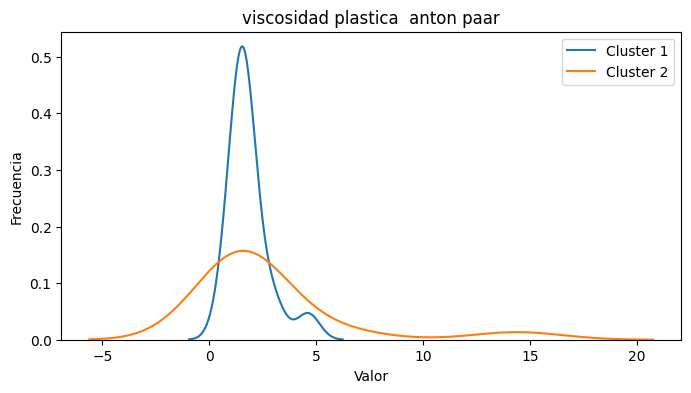

<Figure size 640x480 with 0 Axes>

Start of epoch 0
step 0: mean loss -0.5131 ls 0.01 lr 0.00989999994635582 mu [0.27 0.45 0.19 0.03 0.07]
Start of epoch 1
step 0: mean loss -0.5469 ls 0.01 lr 0.009390000253915787 mu [0.28 0.37 0.2  0.06 0.1 ]
Start of epoch 2
step 0: mean loss -0.5639 ls 0.01 lr 0.008910000324249268 mu [0.27 0.31 0.21 0.09 0.12]
Start of epoch 3
step 0: mean loss -0.5727 ls 0.01 lr 0.008449999615550041 mu [0.27 0.28 0.2  0.11 0.14]
Start of epoch 4
step 0: mean loss -0.5773 ls 0.01 lr 0.008019999600946903 mu [0.26 0.26 0.2  0.13 0.15]
Start of epoch 5
step 0: mean loss -0.5795 ls 0.01 lr 0.007600000128149986 mu [0.25 0.25 0.19 0.15 0.16]
Start of epoch 6
step 0: mean loss -0.5804 ls 0.01 lr 0.007209999952465296 mu [0.24 0.25 0.18 0.17 0.16]
Start of epoch 7
step 0: mean loss -0.5808 ls 0.01 lr 0.006839999929070473 mu [0.24 0.24 0.18 0.18 0.16]
Start of epoch 8
step 0: mean loss -0.5811 ls 0.01 lr 0.006490000057965517 mu [0.24 0.24 0.18 0.18 0.16]
Start of epoch 9
step 0: mean loss -0.5813 ls 0.01 lr 0.

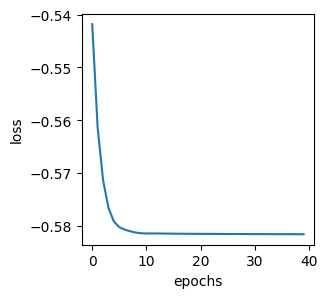

Start of epoch 0
step 0: mean loss 0.0627 ls 0.11 lr 0.009979999624192715
step 0: mean loss 0.0314 ls 0.16 lr 0.009870000183582306
step 0: mean loss 0.0013 ls 0.2 lr 0.009770000353455544
step 0: mean loss -0.0255 ls 0.21 lr 0.009669999592006207
step 0: mean loss -0.0575 ls 0.19 lr 0.009569999761879444
step 0: mean loss -0.0866 ls 0.19 lr 0.009469999931752682
step 0: mean loss -0.1197 ls 0.2 lr 0.00937000010162592
step 0: mean loss -0.1557 ls 0.21 lr 0.009270000271499157
step 0: mean loss -0.1979 ls 0.19 lr 0.009170000441372395
step 0: mean loss -0.2412 ls 0.19 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss -0.2828 ls 0.19 lr 0.008980000391602516
step 0: mean loss -0.3224 ls 0.19 lr 0.0088900001719594
step 0: mean loss -0.3531 ls 0.19 lr 0.008790000341832638
step 0: mean loss -0.3765 ls 0.19 lr 0.008700000122189522
step 0: mean loss -0.3955 ls 0.19 lr 0.008609999902546406
step 0: mean loss -0.4131 ls 0.19 lr 0.00851999968290329
step 0: mean loss -0.4302 ls 0.19 lr 0.0084300

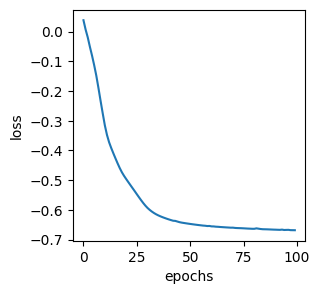

['135', '154', '155', '160', '179']


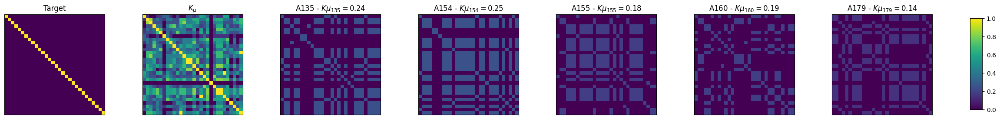

(30, 5)


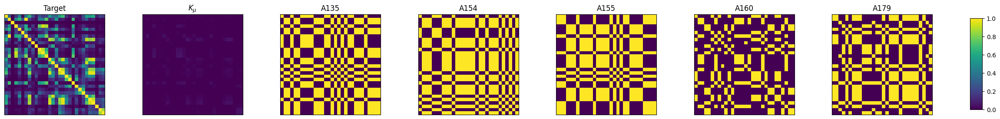

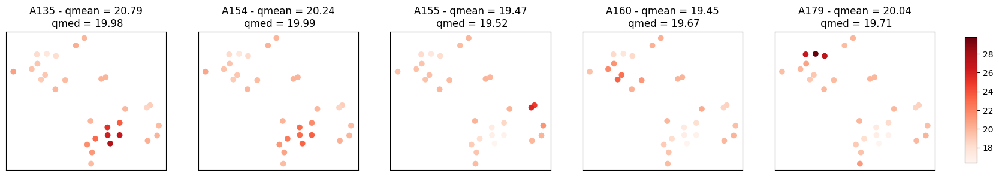

***********************************dulce***********************************


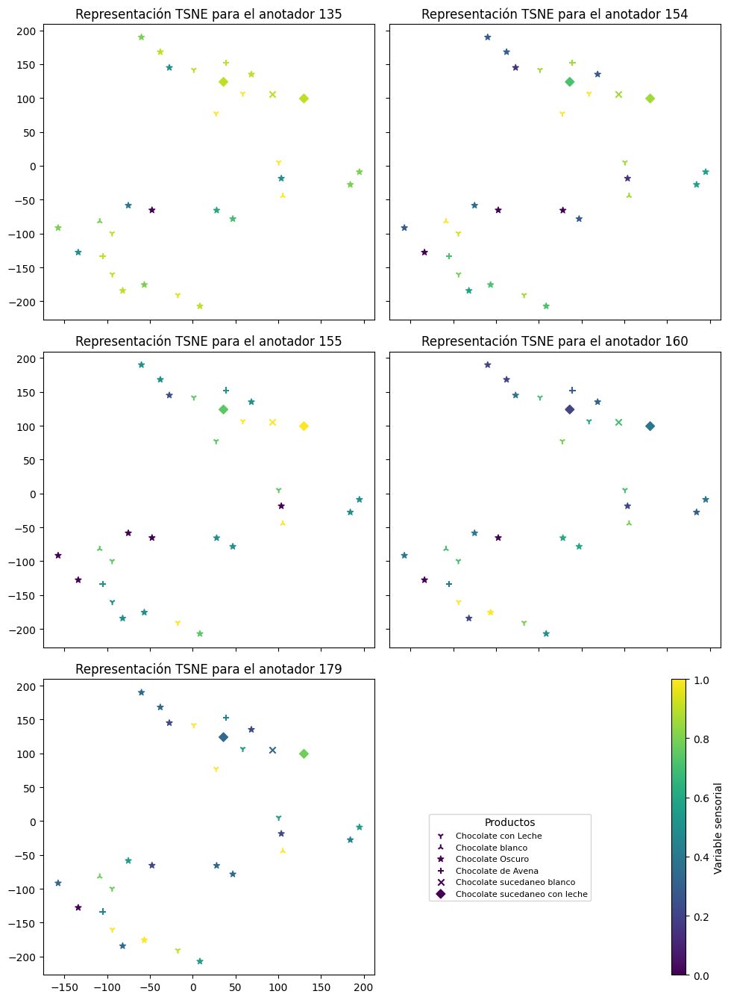

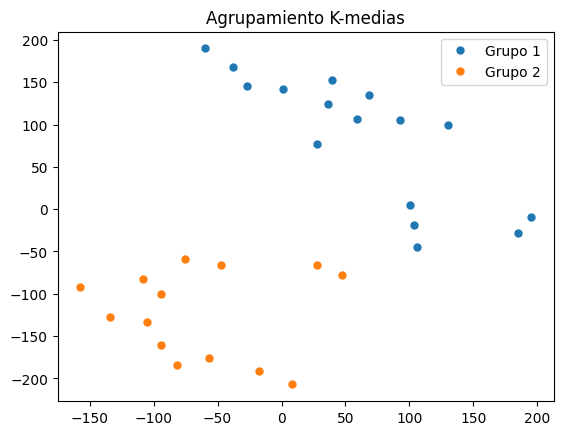

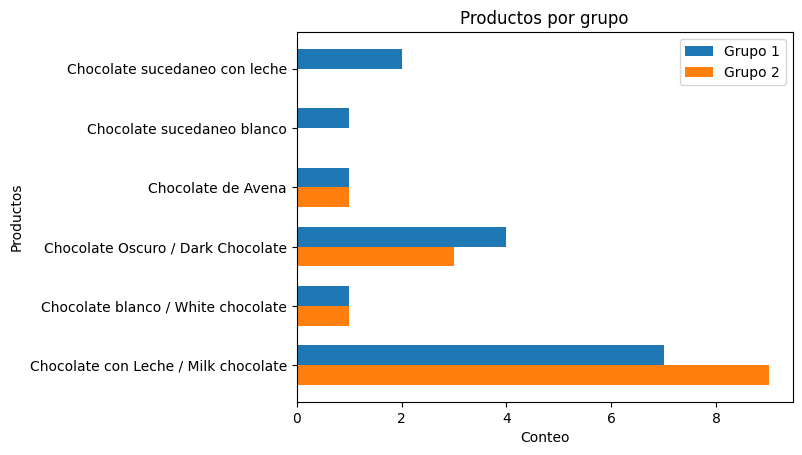

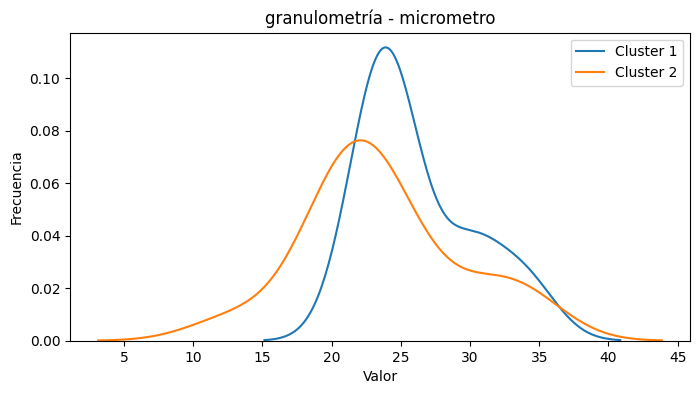

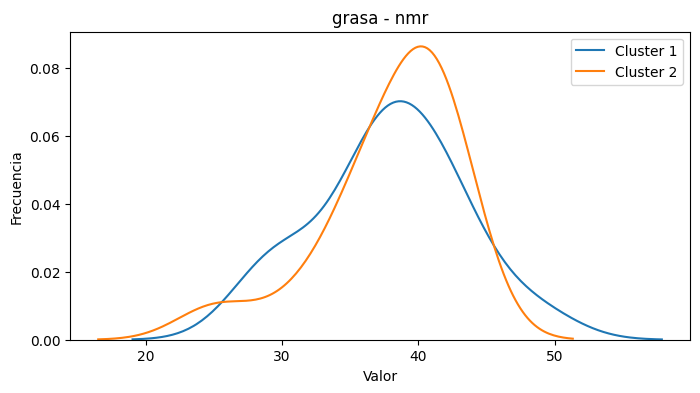

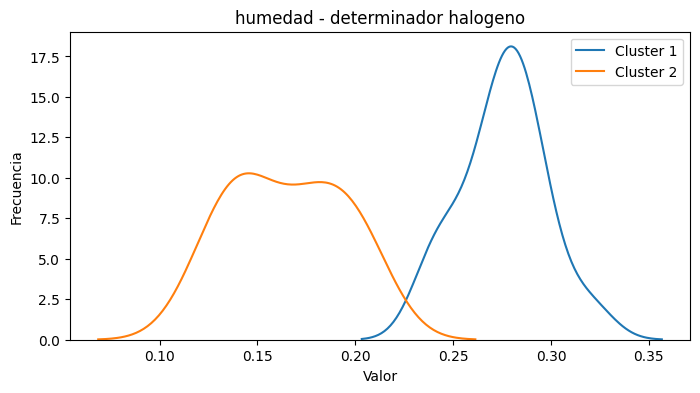

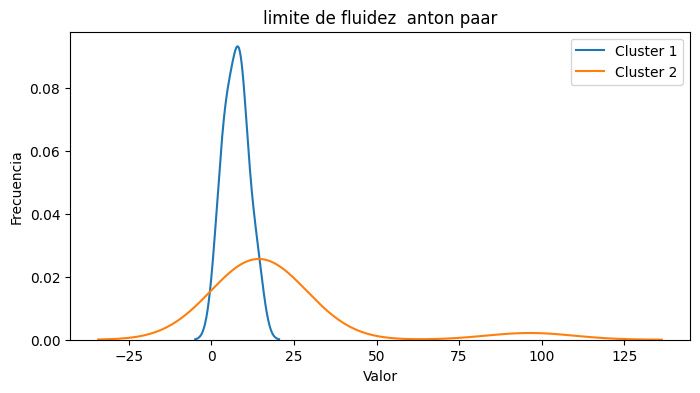

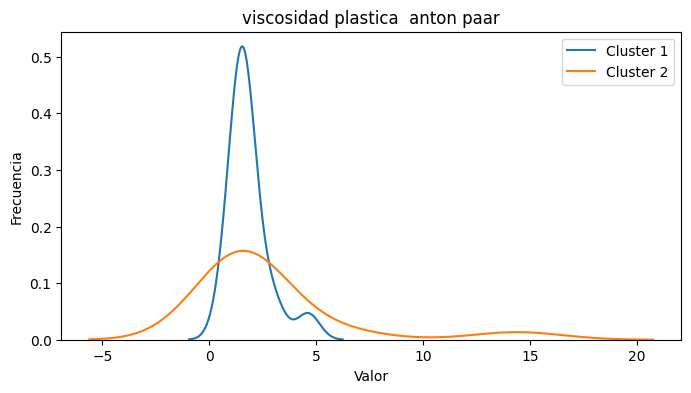

<Figure size 640x480 with 0 Axes>

Start of epoch 0
step 0: mean loss -0.6217 ls 0.01 lr 0.00989999994635582 mu [0.38 0.32 0.13 0.08 0.1 ]
Start of epoch 1
step 0: mean loss -0.6375 ls 0.01 lr 0.009390000253915787 mu [0.35 0.33 0.11 0.1  0.12]
Start of epoch 2
step 0: mean loss -0.6497 ls 0.01 lr 0.008910000324249268 mu [0.32 0.33 0.1  0.11 0.13]
Start of epoch 3
step 0: mean loss -0.6593 ls 0.01 lr 0.008449999615550041 mu [0.3  0.33 0.09 0.13 0.15]
Start of epoch 4
step 0: mean loss -0.667 ls 0.01 lr 0.008019999600946903 mu [0.28 0.32 0.09 0.15 0.17]
Start of epoch 5
step 0: mean loss -0.6732 ls 0.01 lr 0.007600000128149986 mu [0.27 0.31 0.08 0.16 0.18]
Start of epoch 6
step 0: mean loss -0.6779 ls 0.01 lr 0.007209999952465296 mu [0.26 0.3  0.08 0.18 0.19]
Start of epoch 7
step 0: mean loss -0.6814 ls 0.01 lr 0.006839999929070473 mu [0.25 0.29 0.08 0.19 0.2 ]
Start of epoch 8
step 0: mean loss -0.6839 ls 0.01 lr 0.006490000057965517 mu [0.24 0.28 0.07 0.2  0.21]
Start of epoch 9
step 0: mean loss -0.6856 ls 0.01 lr 0.0

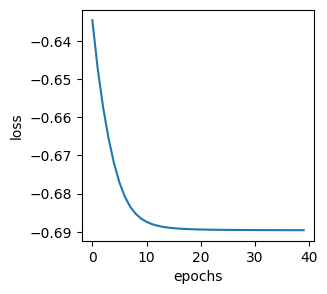

Start of epoch 0
step 0: mean loss 0.1138 ls 0.09 lr 0.009979999624192715
step 0: mean loss 0.0658 ls 0.04 lr 0.009870000183582306
step 0: mean loss 0.0534 ls 0.03 lr 0.009770000353455544
step 0: mean loss 0.0281 ls 0.05 lr 0.009669999592006207
step 0: mean loss 0.0055 ls 0.06 lr 0.009569999761879444
step 0: mean loss -0.0247 ls 0.05 lr 0.009469999931752682
step 0: mean loss -0.058 ls 0.05 lr 0.00937000010162592
step 0: mean loss -0.1003 ls 0.06 lr 0.009270000271499157
step 0: mean loss -0.1478 ls 0.06 lr 0.009170000441372395
step 0: mean loss -0.1976 ls 0.07 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss -0.2443 ls 0.07 lr 0.008980000391602516
step 0: mean loss -0.2804 ls 0.08 lr 0.0088900001719594
step 0: mean loss -0.305 ls 0.08 lr 0.008790000341832638
step 0: mean loss -0.3235 ls 0.08 lr 0.008700000122189522
step 0: mean loss -0.3388 ls 0.08 lr 0.008609999902546406
step 0: mean loss -0.3516 ls 0.09 lr 0.00851999968290329
step 0: mean loss -0.3625 ls 0.09 lr 0.008430000

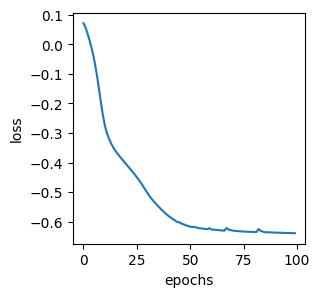

['135', '154', '155', '160', '179']


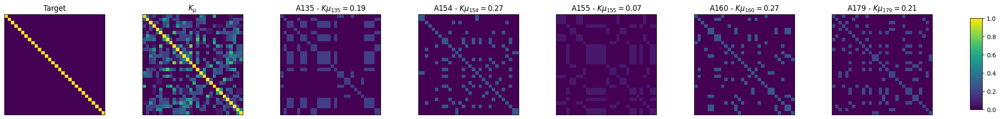

(30, 5)


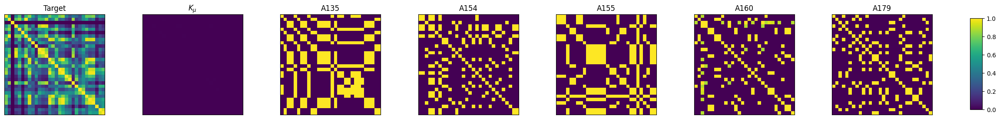

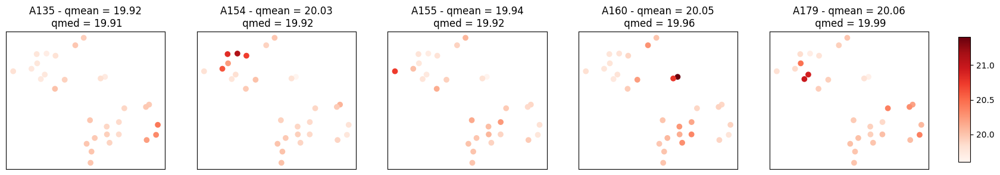

***********************************amargor***********************************


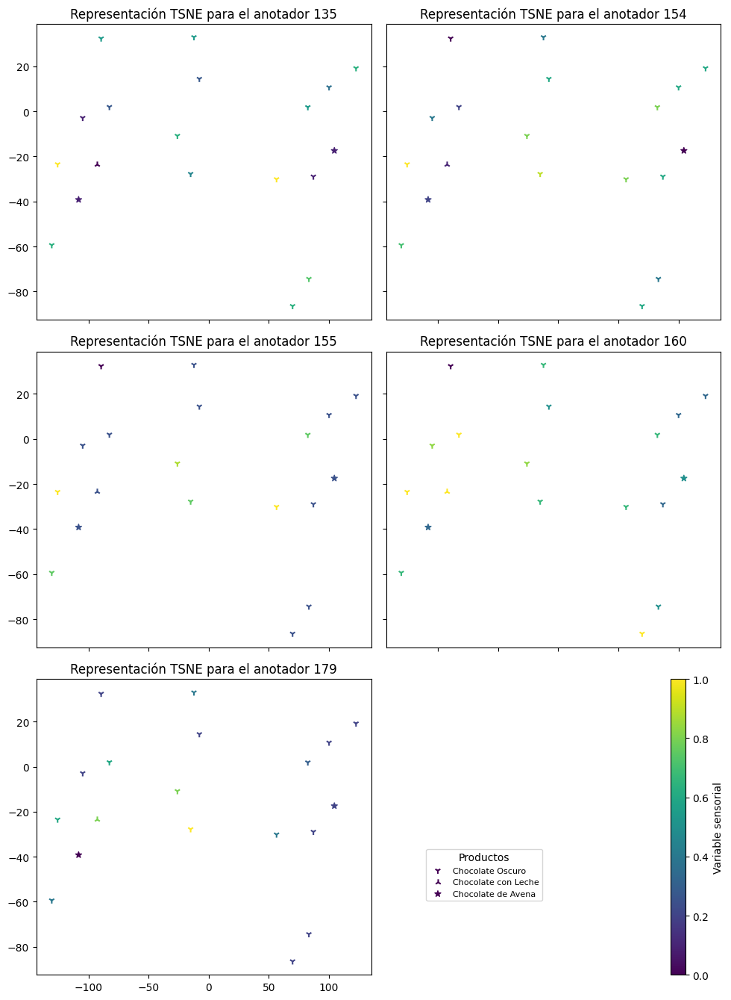

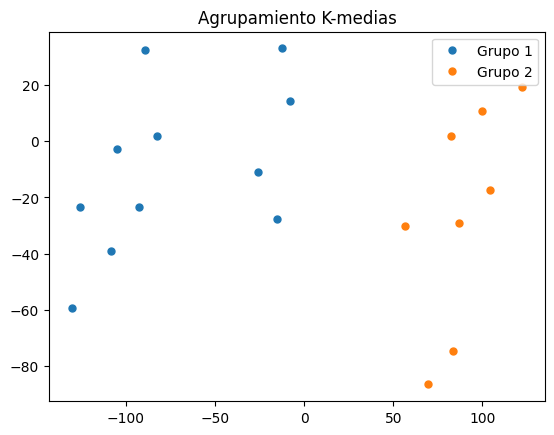

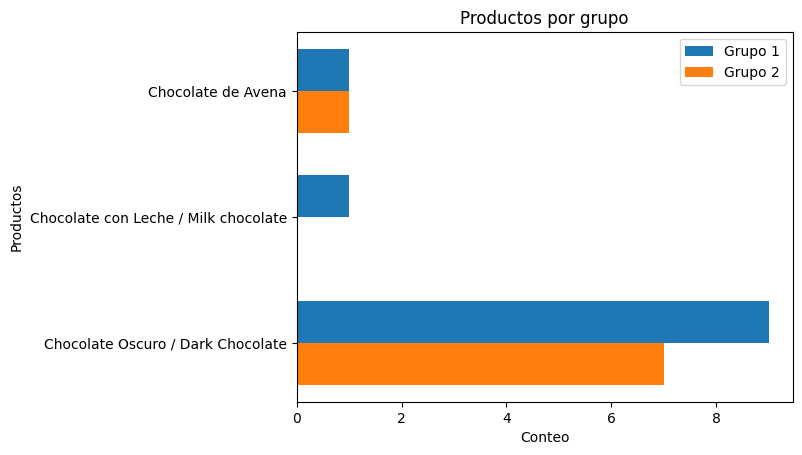

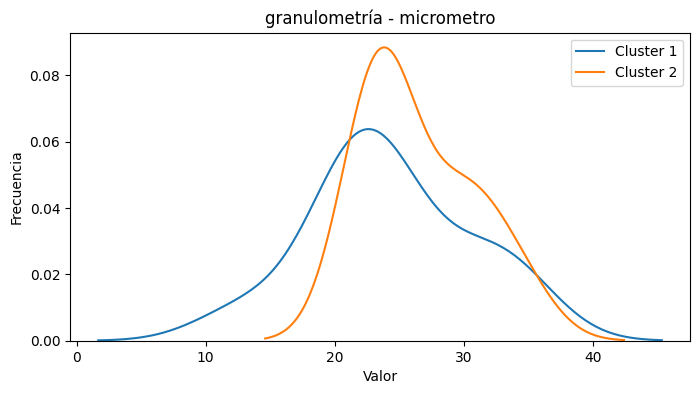

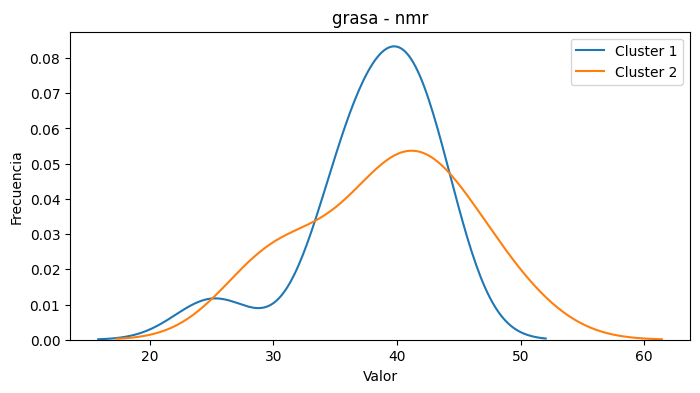

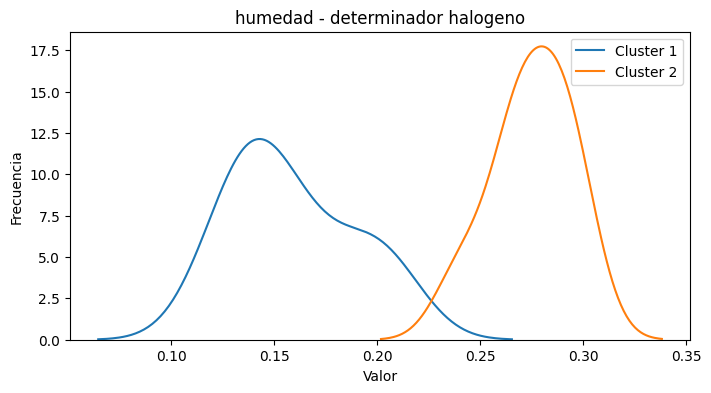

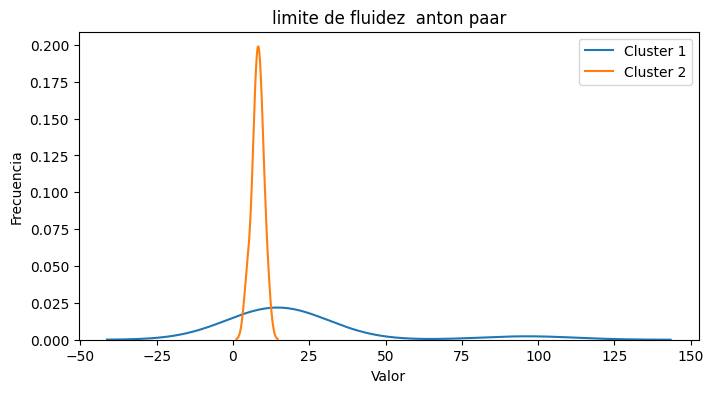

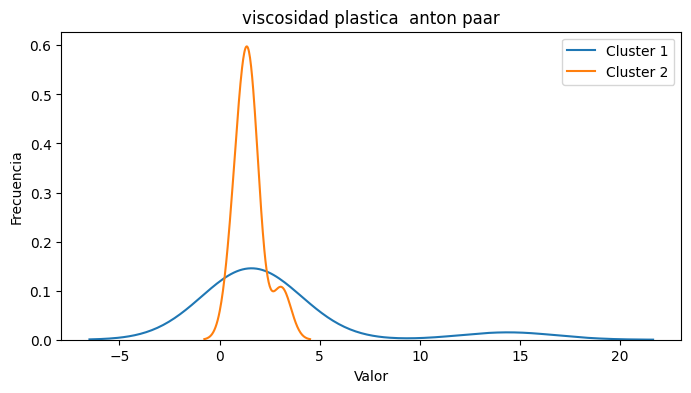

<Figure size 640x480 with 0 Axes>

Start of epoch 0
step 0: mean loss -0.728 ls 0.01 lr 0.00989999994635582 mu [0.37 0.09 0.07 0.18 0.28]
Start of epoch 1
step 0: mean loss -0.7371 ls 0.01 lr 0.009390000253915787 mu [0.4  0.11 0.05 0.16 0.27]
Start of epoch 2
step 0: mean loss -0.7435 ls 0.01 lr 0.008910000324249268 mu [0.42 0.14 0.04 0.15 0.25]
Start of epoch 3
step 0: mean loss -0.7484 ls 0.01 lr 0.008449999615550041 mu [0.43 0.16 0.03 0.16 0.23]
Start of epoch 4
step 0: mean loss -0.7526 ls 0.01 lr 0.008019999600946903 mu [0.42 0.18 0.03 0.16 0.21]
Start of epoch 5
step 0: mean loss -0.756 ls 0.01 lr 0.007600000128149986 mu [0.41 0.2  0.03 0.17 0.19]
Start of epoch 6
step 0: mean loss -0.7589 ls 0.01 lr 0.007209999952465296 mu [0.41 0.22 0.03 0.17 0.18]
Start of epoch 7
step 0: mean loss -0.7612 ls 0.01 lr 0.006839999929070473 mu [0.41 0.24 0.02 0.16 0.17]
Start of epoch 8
step 0: mean loss -0.763 ls 0.01 lr 0.006490000057965517 mu [0.4  0.26 0.02 0.16 0.16]
Start of epoch 9
step 0: mean loss -0.7644 ls 0.01 lr 0.006

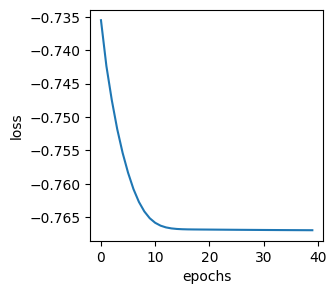

Start of epoch 0
step 0: mean loss 0.0356 ls 0.11 lr 0.009979999624192715
step 0: mean loss -0.0079 ls 0.16 lr 0.009870000183582306
step 0: mean loss -0.0595 ls 0.21 lr 0.009770000353455544
step 0: mean loss -0.0984 ls 0.25 lr 0.009669999592006207
step 0: mean loss -0.1286 ls 0.27 lr 0.009569999761879444
step 0: mean loss -0.1627 ls 0.26 lr 0.009469999931752682
step 0: mean loss -0.1973 ls 0.24 lr 0.00937000010162592
step 0: mean loss -0.2253 ls 0.23 lr 0.009270000271499157
step 0: mean loss -0.2505 ls 0.23 lr 0.009170000441372395
step 0: mean loss -0.2756 ls 0.25 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss -0.2984 ls 0.26 lr 0.008980000391602516
step 0: mean loss -0.3189 ls 0.27 lr 0.0088900001719594
step 0: mean loss -0.3387 ls 0.27 lr 0.008790000341832638
step 0: mean loss -0.3573 ls 0.27 lr 0.008700000122189522
step 0: mean loss -0.3744 ls 0.27 lr 0.008609999902546406
step 0: mean loss -0.3893 ls 0.27 lr 0.00851999968290329
step 0: mean loss -0.4028 ls 0.27 lr 0.008

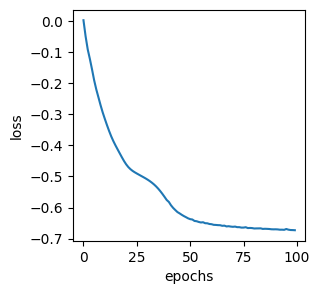

['135', '154', '155', '160', '179']


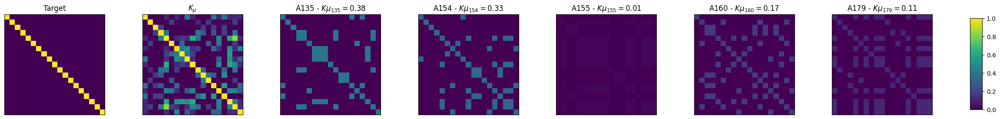

(19, 5)


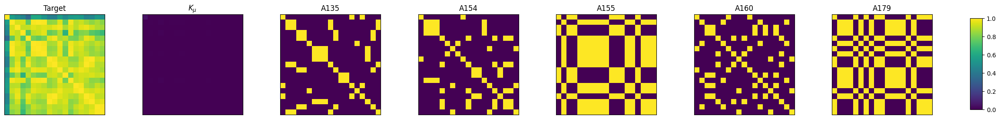

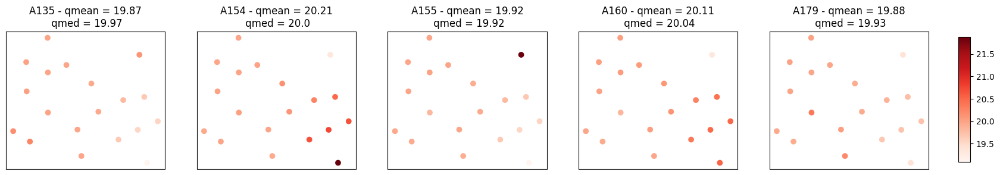

***********************************acidez***********************************


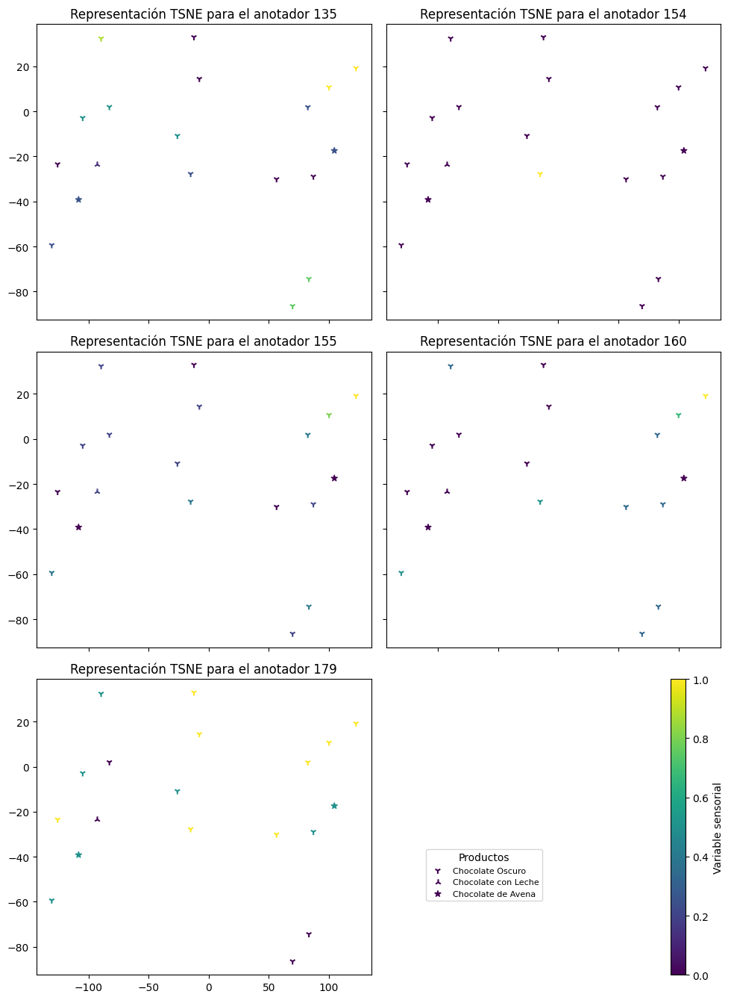

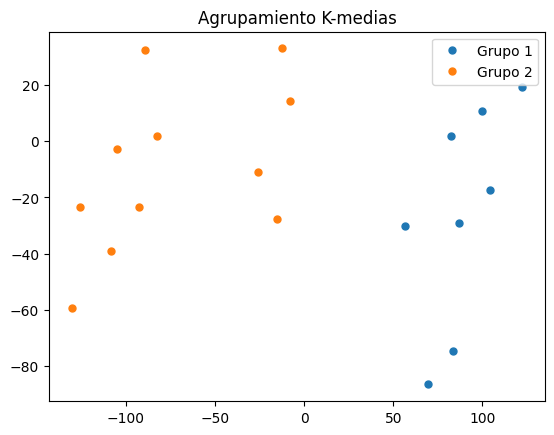

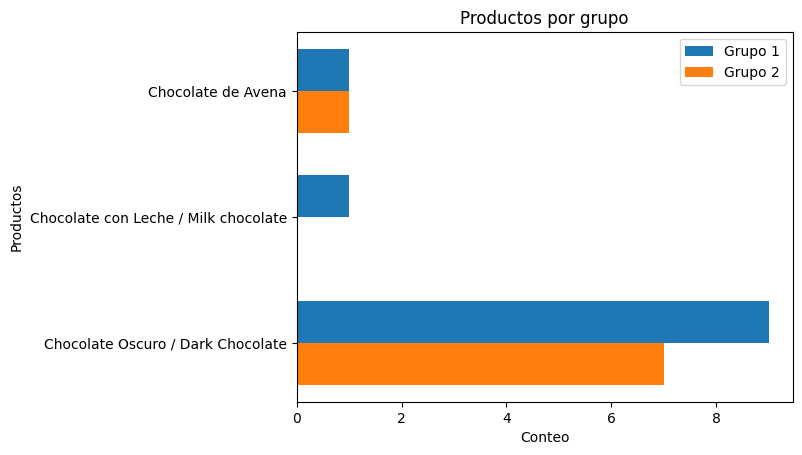

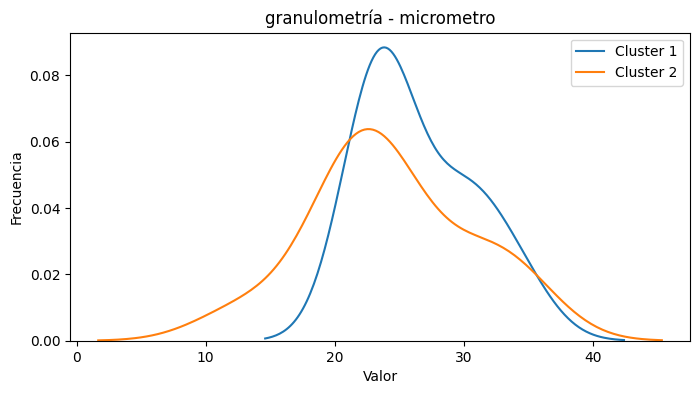

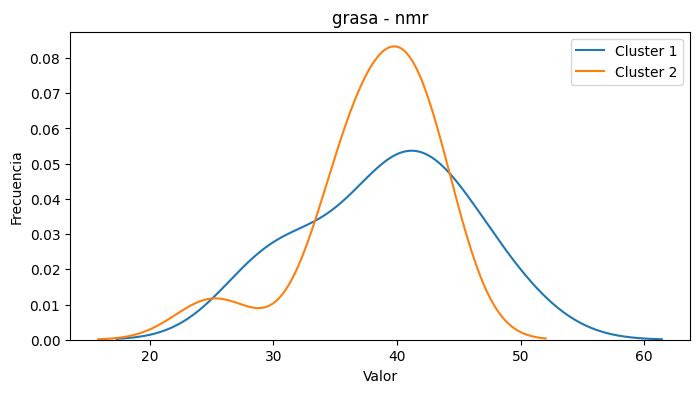

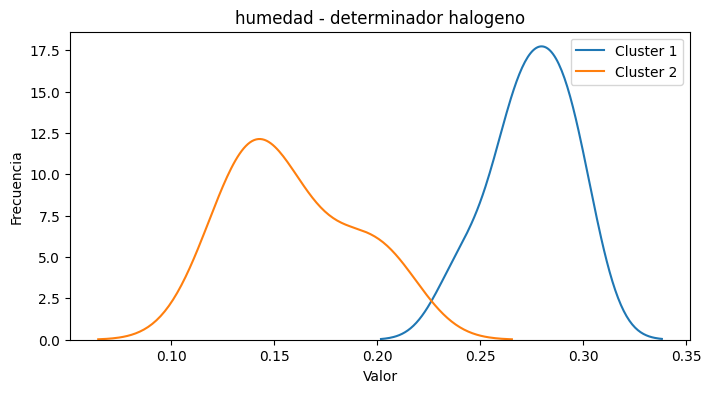

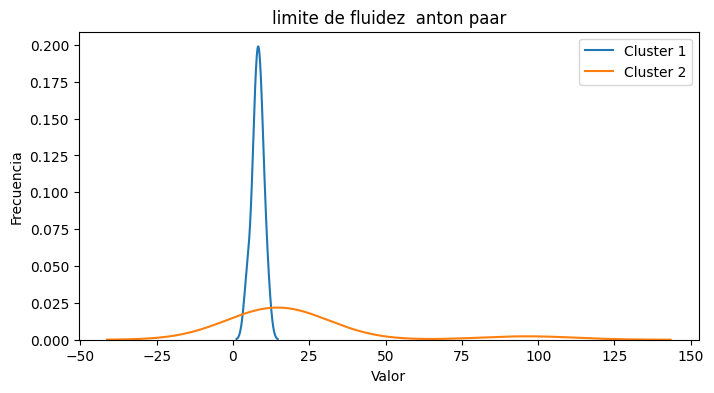

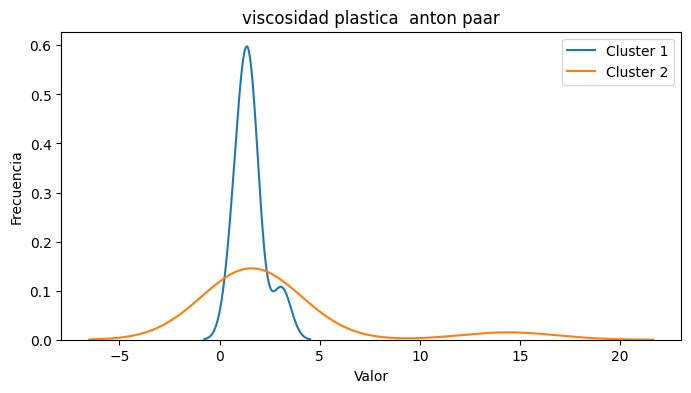

<Figure size 640x480 with 0 Axes>

Start of epoch 0
step 0: mean loss -0.5795 ls 0.01 lr 0.00989999994635582 mu [0.13 0.25 0.25 0.11 0.26]
Start of epoch 1
step 0: mean loss -0.5894 ls 0.01 lr 0.009390000253915787 mu [0.15 0.26 0.23 0.12 0.25]
Start of epoch 2
step 0: mean loss -0.5978 ls 0.01 lr 0.008910000324249268 mu [0.16 0.27 0.22 0.13 0.23]
Start of epoch 3
step 0: mean loss -0.6049 ls 0.01 lr 0.008449999615550041 mu [0.17 0.28 0.2  0.14 0.22]
Start of epoch 4
step 0: mean loss -0.6106 ls 0.01 lr 0.008019999600946903 mu [0.17 0.29 0.19 0.15 0.21]
Start of epoch 5
step 0: mean loss -0.6151 ls 0.01 lr 0.007600000128149986 mu [0.18 0.29 0.18 0.15 0.19]
Start of epoch 6
step 0: mean loss -0.6186 ls 0.01 lr 0.007209999952465296 mu [0.19 0.3  0.17 0.16 0.18]
Start of epoch 7
step 0: mean loss -0.6213 ls 0.01 lr 0.006839999929070473 mu [0.2  0.31 0.16 0.16 0.18]
Start of epoch 8
step 0: mean loss -0.6234 ls 0.01 lr 0.006490000057965517 mu [0.2  0.31 0.15 0.17 0.17]
Start of epoch 9
step 0: mean loss -0.6249 ls 0.01 lr 0.

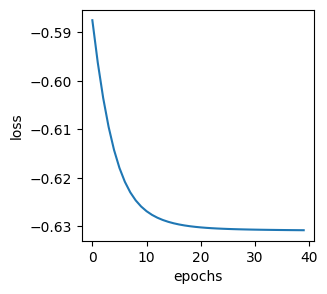

Start of epoch 0
step 0: mean loss 0.0673 ls 0.09 lr 0.009979999624192715
step 0: mean loss 0.0495 ls 0.05 lr 0.009870000183582306
step 0: mean loss 0.0388 ls 0.02 lr 0.009770000353455544
step 0: mean loss 0.0272 ls 0.01 lr 0.009669999592006207
step 0: mean loss 0.0146 ls 0.0 lr 0.009569999761879444
step 0: mean loss 0.0002 ls -0.0 lr 0.009469999931752682
step 0: mean loss -0.0162 ls -0.0 lr 0.00937000010162592
step 0: mean loss -0.0353 ls -0.01 lr 0.009270000271499157
step 0: mean loss -0.0578 ls -0.01 lr 0.009170000441372395
step 0: mean loss -0.0845 ls -0.01 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss -0.1169 ls -0.01 lr 0.008980000391602516
step 0: mean loss -0.1561 ls -0.01 lr 0.0088900001719594
step 0: mean loss -0.201 ls -0.01 lr 0.008790000341832638
step 0: mean loss -0.2492 ls -0.01 lr 0.008700000122189522
step 0: mean loss -0.295 ls -0.01 lr 0.008609999902546406
step 0: mean loss -0.3337 ls -0.01 lr 0.00851999968290329
step 0: mean loss -0.3632 ls -0.01 lr 0.0

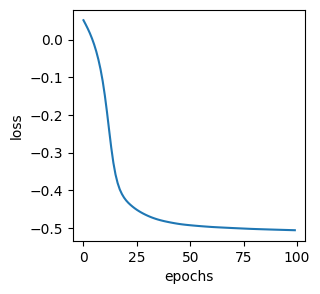

['135', '154', '155', '160', '179']


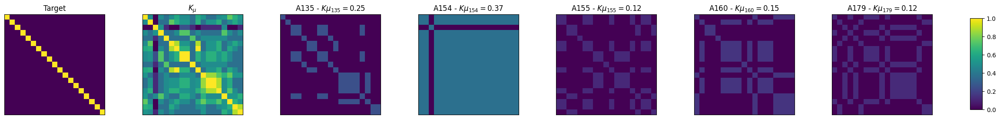

(19, 5)


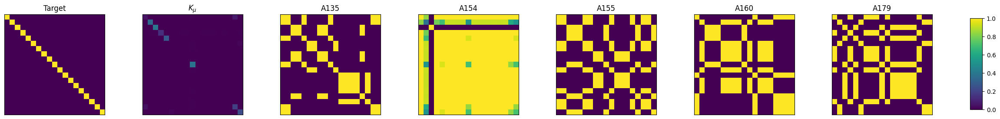

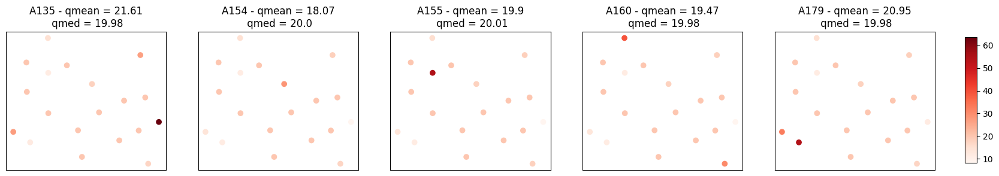

***********************************astringencia***********************************


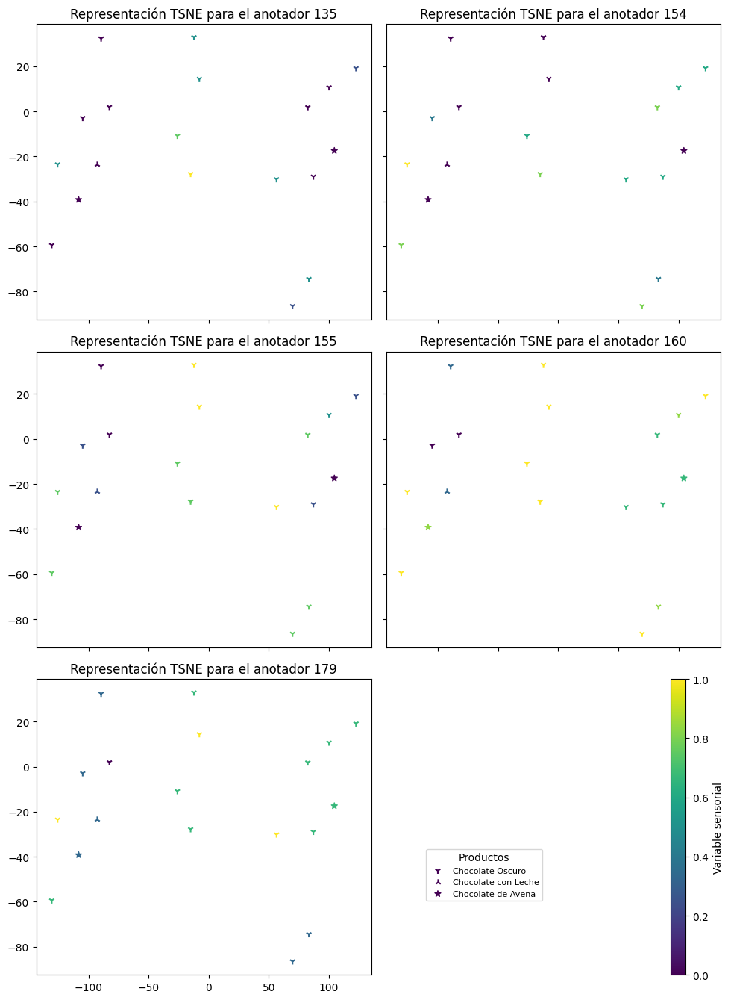

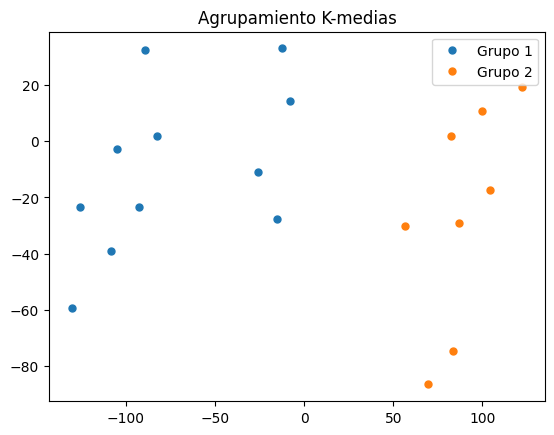

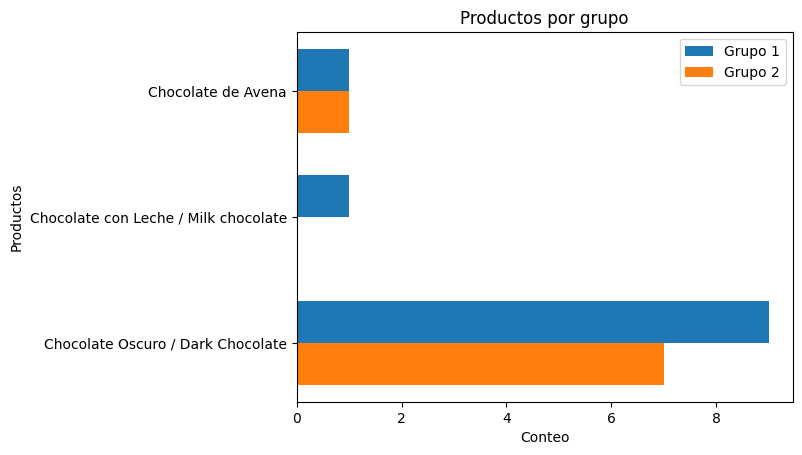

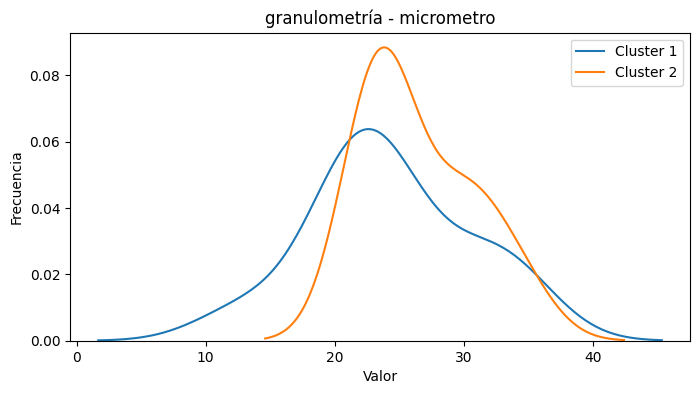

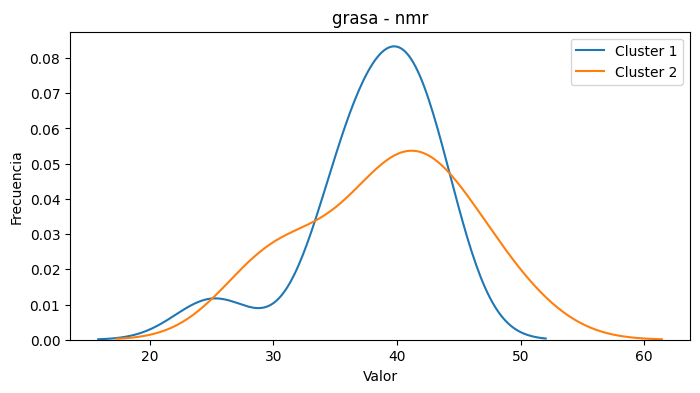

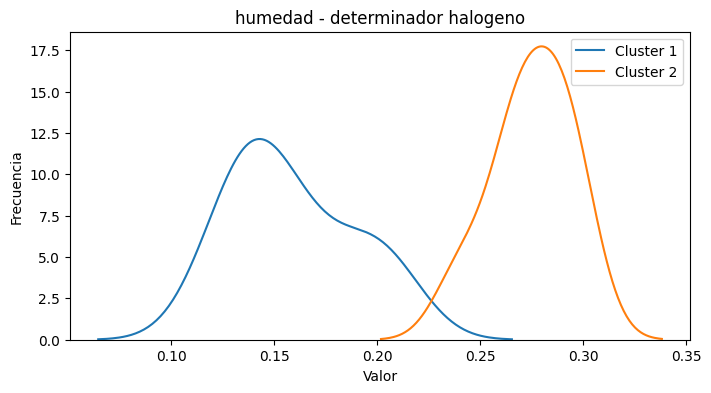

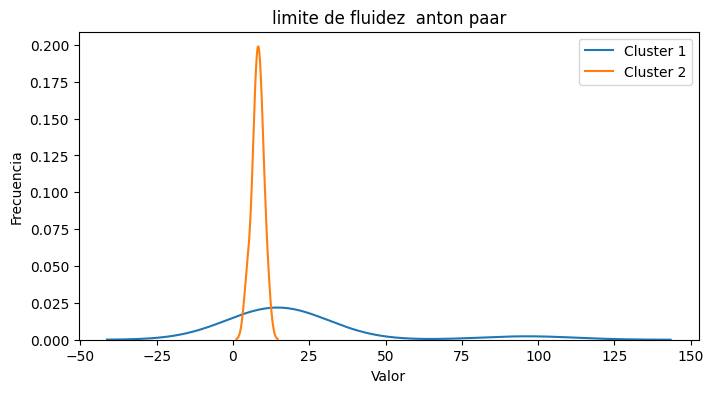

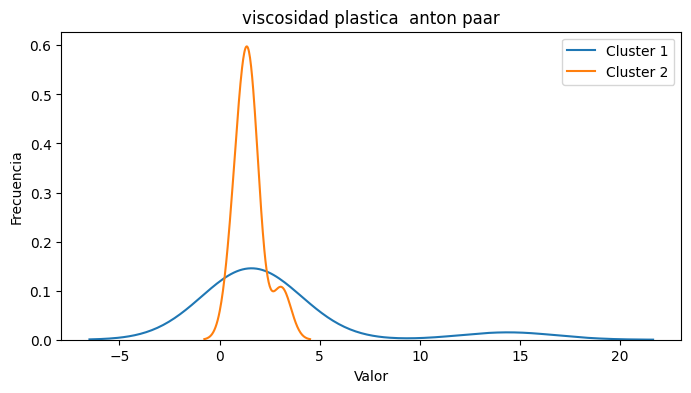

<Figure size 640x480 with 0 Axes>

Start of epoch 0
step 0: mean loss -0.5416 ls 0.01 lr 0.00989999994635582 mu [0.16 0.23 0.03 0.09 0.49]
Start of epoch 1
step 0: mean loss -0.5675 ls 0.01 lr 0.009390000253915787 mu [0.17 0.24 0.05 0.11 0.43]
Start of epoch 2
step 0: mean loss -0.5869 ls 0.01 lr 0.008910000324249268 mu [0.18 0.24 0.06 0.12 0.39]
Start of epoch 3
step 0: mean loss -0.6012 ls 0.01 lr 0.008449999615550041 mu [0.19 0.25 0.08 0.13 0.35]
Start of epoch 4
step 0: mean loss -0.6115 ls 0.01 lr 0.008019999600946903 mu [0.2  0.25 0.09 0.14 0.32]
Start of epoch 5
step 0: mean loss -0.6189 ls 0.01 lr 0.007600000128149986 mu [0.2  0.25 0.1  0.15 0.3 ]
Start of epoch 6
step 0: mean loss -0.6244 ls 0.01 lr 0.007209999952465296 mu [0.2  0.25 0.11 0.16 0.28]
Start of epoch 7
step 0: mean loss -0.6284 ls 0.01 lr 0.006839999929070473 mu [0.2  0.25 0.11 0.17 0.27]
Start of epoch 8
step 0: mean loss -0.6315 ls 0.01 lr 0.006490000057965517 mu [0.2  0.25 0.12 0.17 0.25]
Start of epoch 9
step 0: mean loss -0.6339 ls 0.01 lr 0.

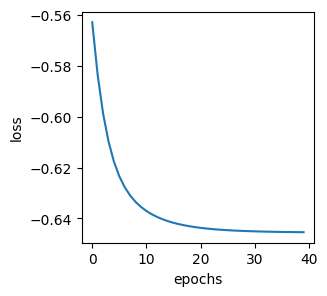

Start of epoch 0
step 0: mean loss -0.0029 ls 0.11 lr 0.009979999624192715
step 0: mean loss -0.0944 ls 0.16 lr 0.009870000183582306
step 0: mean loss -0.149 ls 0.2 lr 0.009770000353455544
step 0: mean loss -0.1893 ls 0.21 lr 0.009669999592006207
step 0: mean loss -0.2342 ls 0.2 lr 0.009569999761879444
step 0: mean loss -0.2738 ls 0.19 lr 0.009469999931752682
step 0: mean loss -0.3057 ls 0.19 lr 0.00937000010162592
step 0: mean loss -0.3365 ls 0.19 lr 0.009270000271499157
step 0: mean loss -0.3653 ls 0.2 lr 0.009170000441372395
step 0: mean loss -0.3915 ls 0.21 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss -0.4169 ls 0.21 lr 0.008980000391602516
step 0: mean loss -0.4416 ls 0.21 lr 0.0088900001719594
step 0: mean loss -0.4658 ls 0.22 lr 0.008790000341832638
step 0: mean loss -0.4898 ls 0.22 lr 0.008700000122189522
step 0: mean loss -0.5131 ls 0.23 lr 0.008609999902546406
step 0: mean loss -0.5347 ls 0.23 lr 0.00851999968290329
step 0: mean loss -0.5542 ls 0.23 lr 0.008430

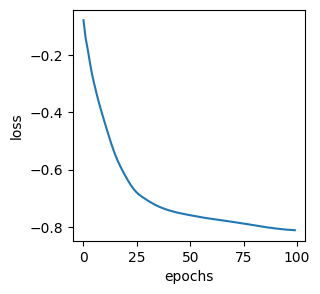

['135', '154', '155', '160', '179']


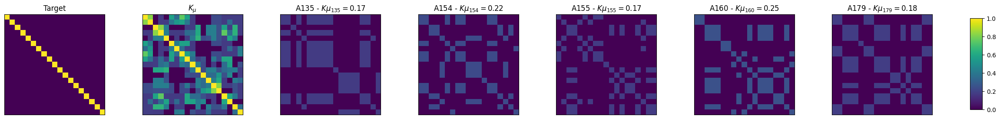

(19, 5)


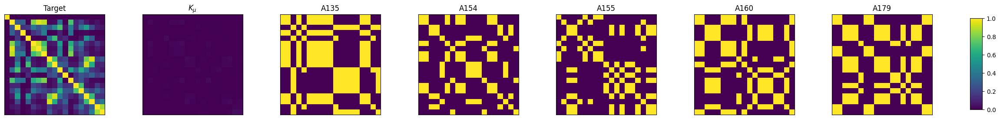

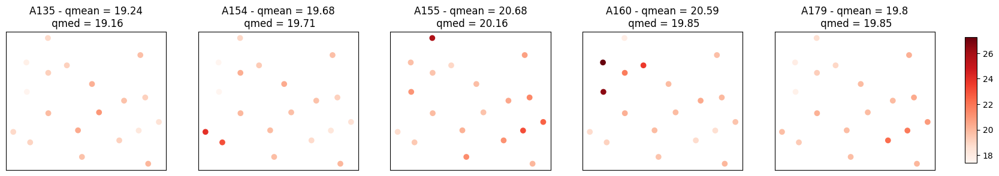

***********************************velocidad fusion***********************************


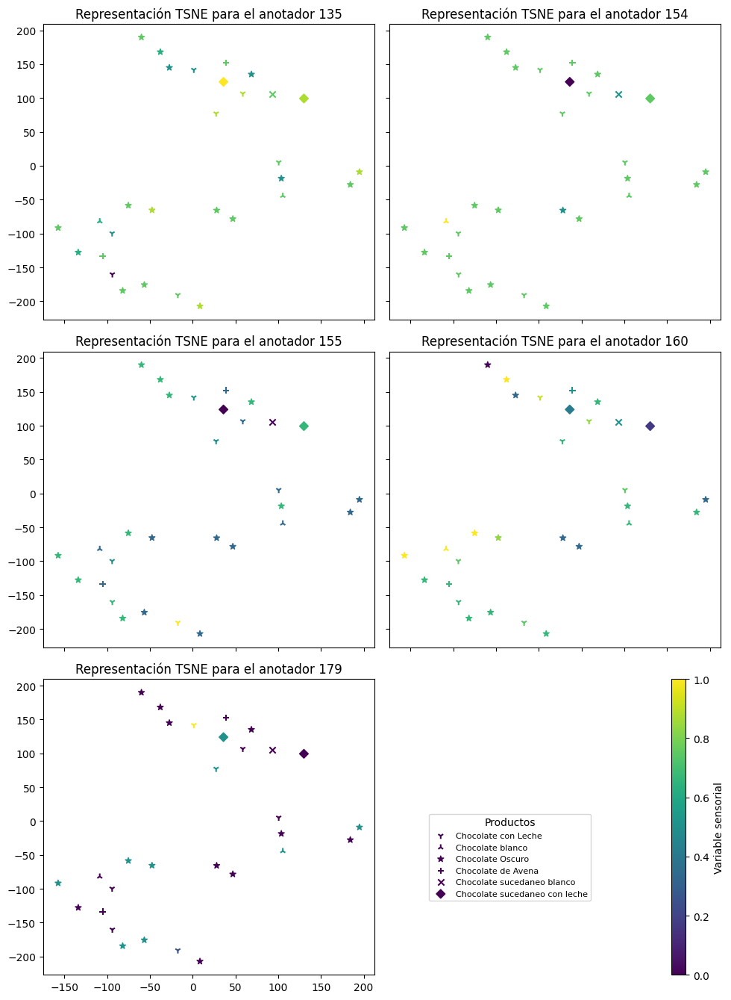

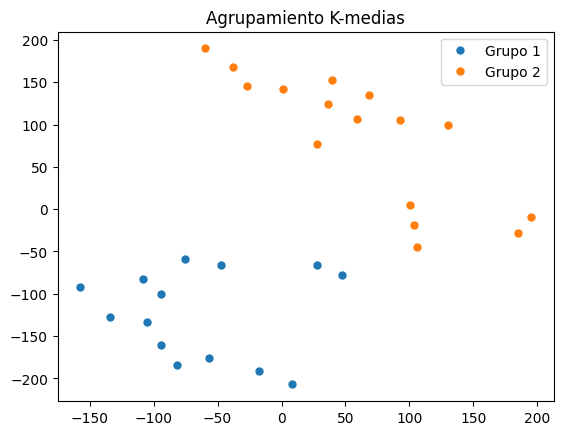

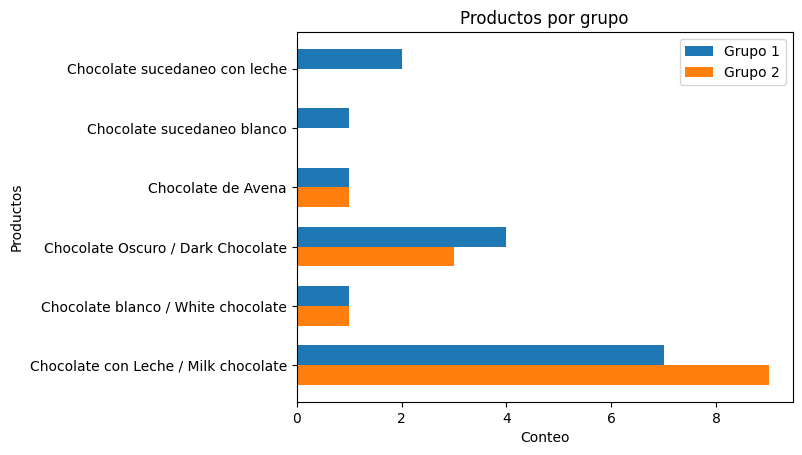

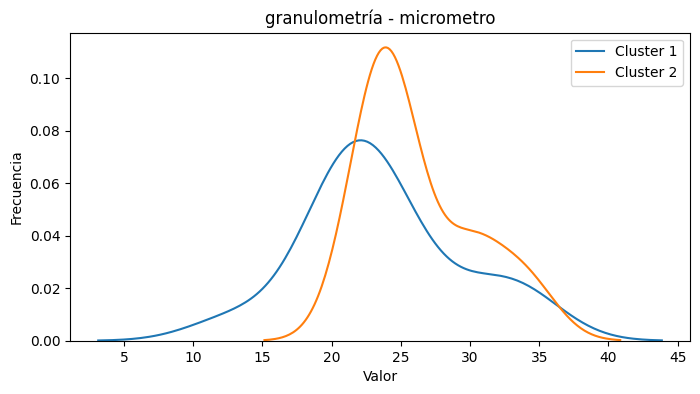

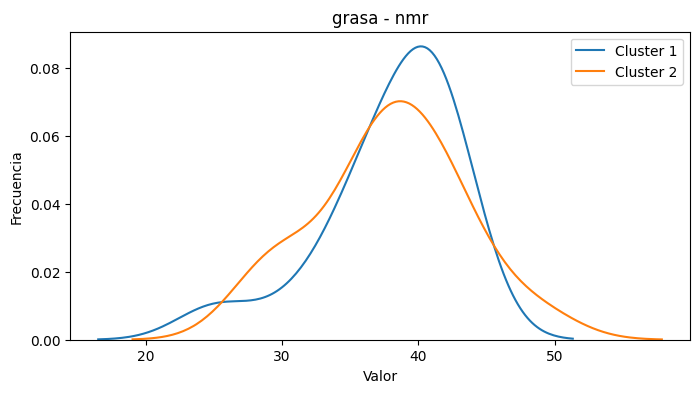

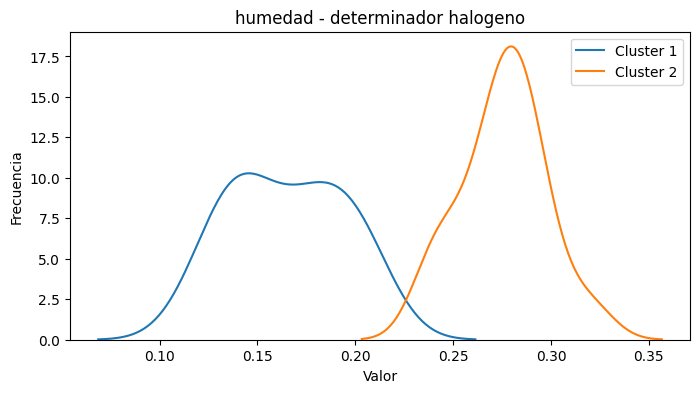

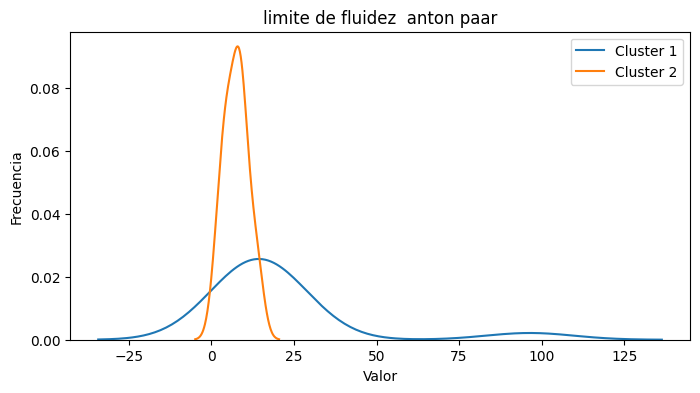

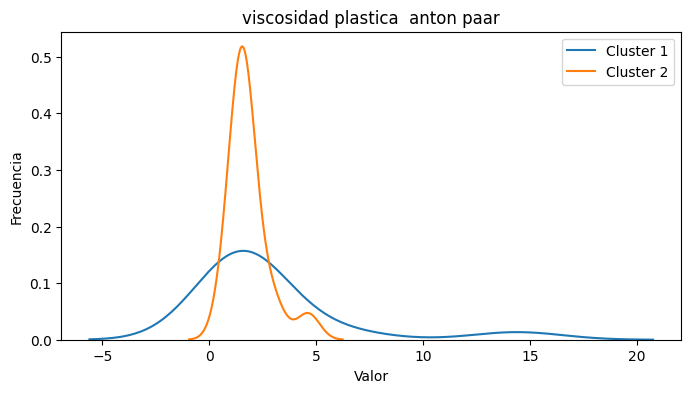

<Figure size 640x480 with 0 Axes>

Start of epoch 0
step 0: mean loss -0.4737 ls 0.01 lr 0.00989999994635582 mu [0.16 0.1  0.47 0.25 0.02]
Start of epoch 1
step 0: mean loss -0.5037 ls 0.01 lr 0.009390000253915787 mu [0.17 0.12 0.41 0.26 0.04]
Start of epoch 2
step 0: mean loss -0.5277 ls 0.01 lr 0.008910000324249268 mu [0.18 0.13 0.36 0.26 0.06]
Start of epoch 3
step 0: mean loss -0.5461 ls 0.01 lr 0.008449999615550041 mu [0.19 0.14 0.32 0.27 0.08]
Start of epoch 4
step 0: mean loss -0.5598 ls 0.01 lr 0.008019999600946903 mu [0.2  0.15 0.29 0.27 0.09]
Start of epoch 5
step 0: mean loss -0.5697 ls 0.01 lr 0.007600000128149986 mu [0.2  0.16 0.26 0.28 0.1 ]
Start of epoch 6
step 0: mean loss -0.577 ls 0.01 lr 0.007209999952465296 mu [0.2  0.17 0.24 0.28 0.11]
Start of epoch 7
step 0: mean loss -0.5823 ls 0.01 lr 0.006839999929070473 mu [0.2  0.18 0.22 0.28 0.12]
Start of epoch 8
step 0: mean loss -0.5861 ls 0.01 lr 0.006490000057965517 mu [0.2  0.19 0.21 0.29 0.12]
Start of epoch 9
step 0: mean loss -0.5889 ls 0.01 lr 0.0

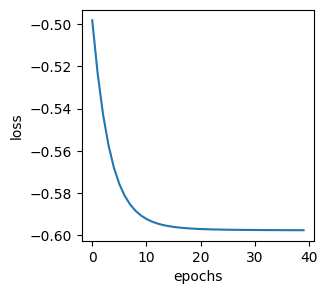

Start of epoch 0
step 0: mean loss 0.0432 ls 0.11 lr 0.009979999624192715
step 0: mean loss 0.0068 ls 0.16 lr 0.009870000183582306
step 0: mean loss -0.0153 ls 0.18 lr 0.009770000353455544
step 0: mean loss -0.0385 ls 0.18 lr 0.009669999592006207
step 0: mean loss -0.0657 ls 0.17 lr 0.009569999761879444
step 0: mean loss -0.0926 ls 0.16 lr 0.009469999931752682
step 0: mean loss -0.1208 ls 0.17 lr 0.00937000010162592
step 0: mean loss -0.1482 ls 0.18 lr 0.009270000271499157
step 0: mean loss -0.1738 ls 0.18 lr 0.009170000441372395
step 0: mean loss -0.1973 ls 0.17 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss -0.2179 ls 0.17 lr 0.008980000391602516
step 0: mean loss -0.2353 ls 0.18 lr 0.0088900001719594
step 0: mean loss -0.2498 ls 0.17 lr 0.008790000341832638
step 0: mean loss -0.2618 ls 0.17 lr 0.008700000122189522
step 0: mean loss -0.2723 ls 0.18 lr 0.008609999902546406
step 0: mean loss -0.2814 ls 0.18 lr 0.00851999968290329
step 0: mean loss -0.2899 ls 0.18 lr 0.0084

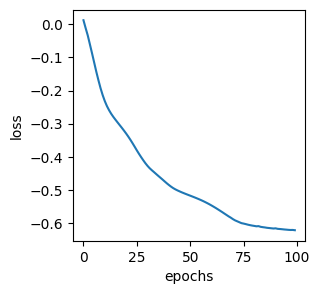

['135', '154', '155', '160', '179']


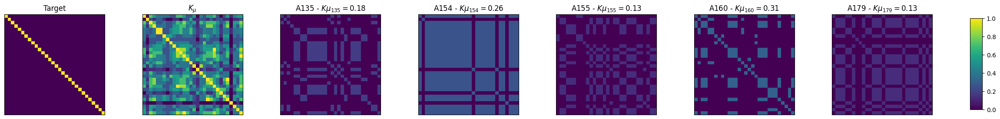

(30, 5)


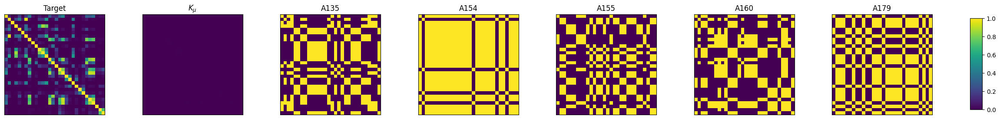

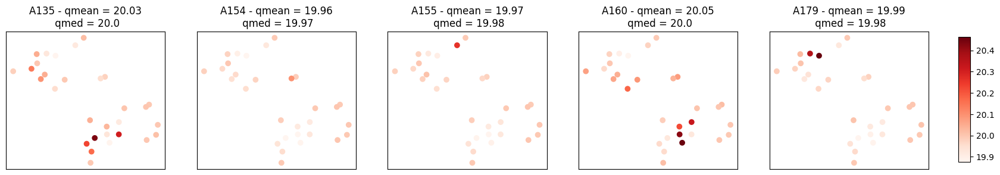

In [ ]:
muestras = {}
models_CKA = {}
models_LCKA = {}

for var in variables:
    print('*'*35 + var + '*'*35)
    df_vars, df_ma, anotadores = create_dfs(df_comb.copy(), fq_variables, [var], 5)
    anotadores = lista_ann
    df_ma = df_ma.loc[:, [(var, ann) for ann in anotadores]]
    muestras[var] = df_vars.index
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    X = scaler_X.fit_transform(df_vars.values)
    y = scaler_y.fit_transform(df_ma.values)
    df_fq2 = df_fq.set_index('CodMuestra')
    dict_mstr_subm = {idx : df_fq2.loc[idx, 'SubMatriz'] for idx in df_ma.index}
    productos = pd.Series([dict_mstr_subm[idx] for idx in df_ma.index])
    productos_unicos = productos.unique()
    markers = ["1", "2", "*", "+", "x", "D", "."]
    # _ = plot_MA_red(X, y, anotadores, markers, productos_unicos, method='pca')
    X_red = plot_MA_red(X, y, anotadores, markers, productos, productos_unicos, method='tsne')
    labels = plot_clusters(X_red, productos)
    plot_kde_clusters(df_vars, labels)
    iAnn = get_iAnn(y)
    model_CKA = CKA(batch_size=30,iAnn=iAnn, epochs=40)
    model_CKA.fit(X,y)
    model_CKA.plot_history()
    model_LCKA = LCKA(batch_size=30,iAnn=iAnn,lr=1e-2, epochs=100)
    model_LCKA.fit(X,y)
    model_LCKA.plot_history()
    print(anotadores)
    model_CKA.plot_kernels(X, y, iAnn, anotadores)
    q = model_LCKA.plot_kernels(X, y, iAnn, anotadores)
    model_LCKA.plot_lckaQ(X,q, redlcka = 'tsne',random_state = 123,n_neighbors=10,cmap='Reds',annotators=anotadores)
    models_CKA[var] = model_CKA
    models_LCKA[var] = model_LCKA

# With nan values

***********************************aroma***********************************


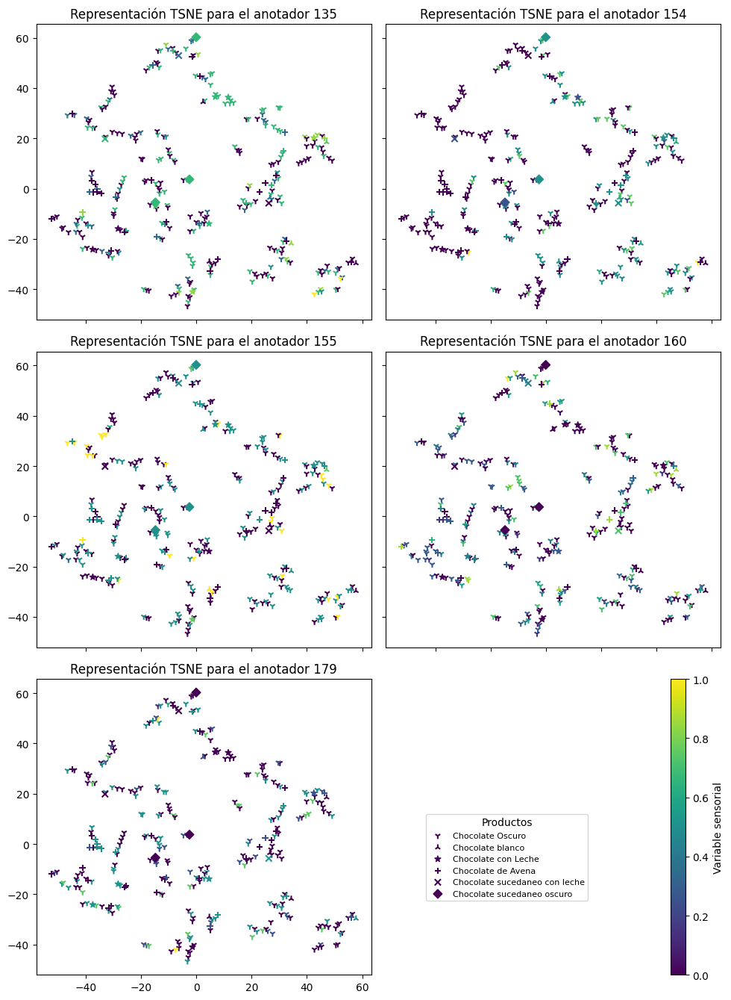

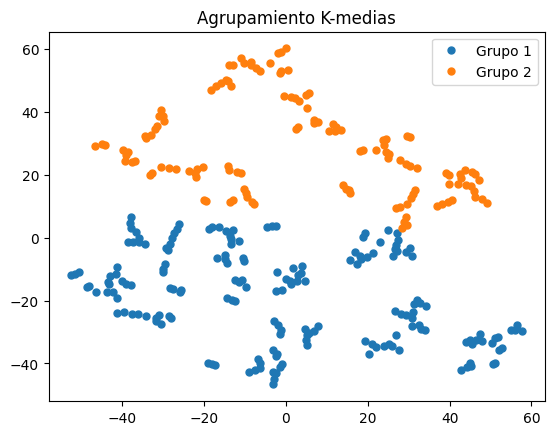

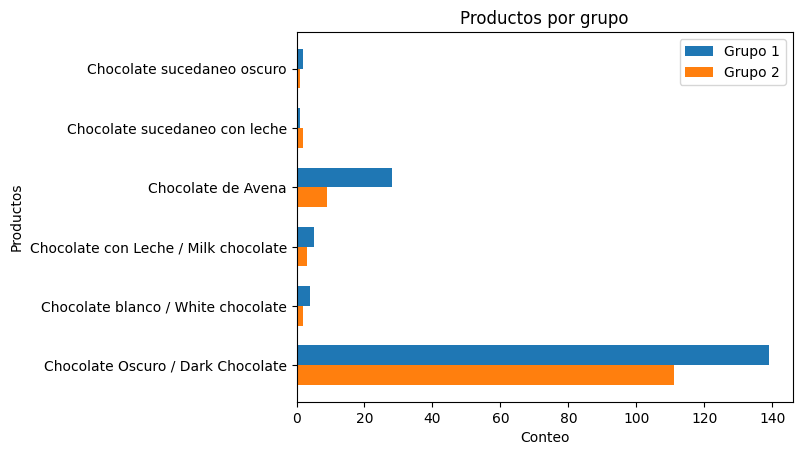

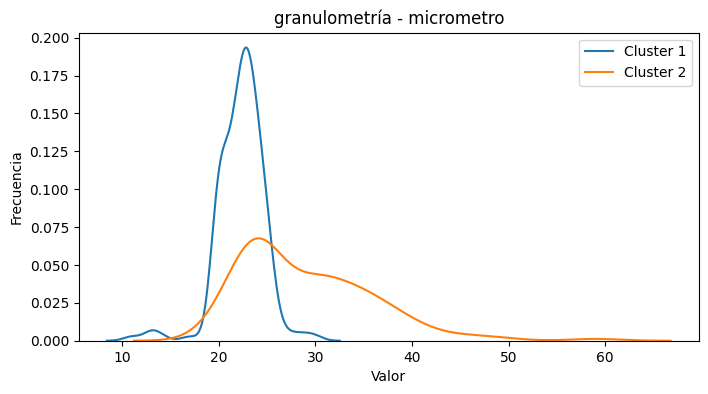

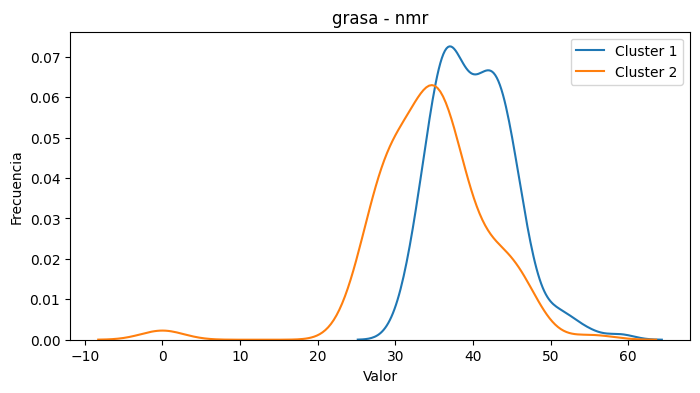

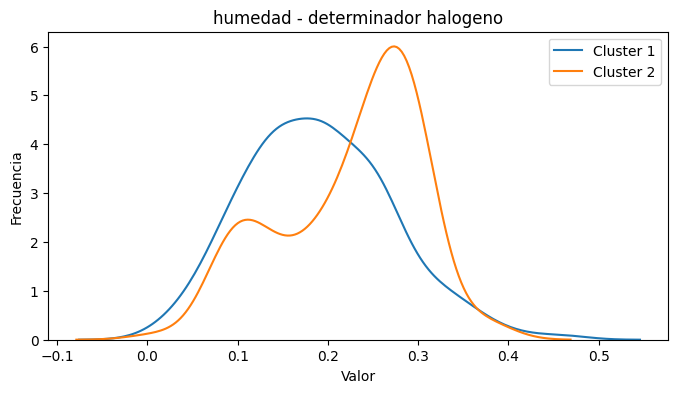

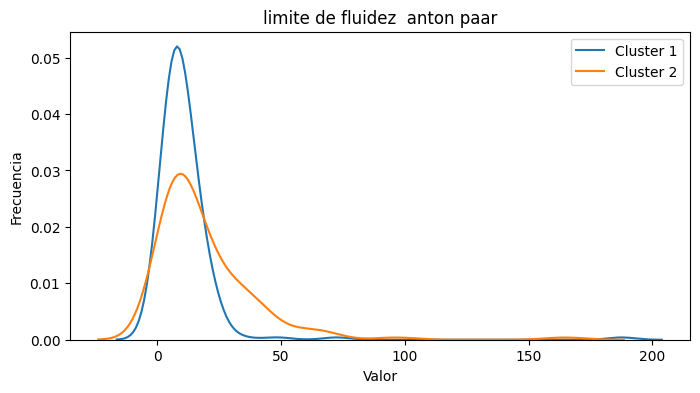

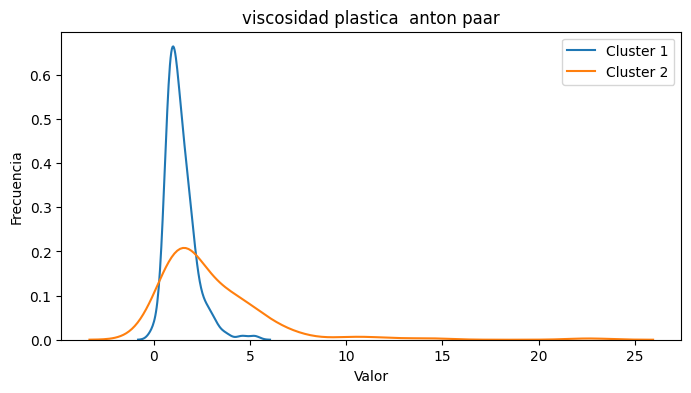

<Figure size 640x480 with 0 Axes>

Start of epoch 0
step 0: mean loss -0.1871 ls 0.01 lr 0.00989999994635582 mu [0.07 0.16 0.32 0.37 0.08]
Start of epoch 1
step 0: mean loss -0.1953 ls 0.01 lr 0.009390000253915787 mu [0.09 0.17 0.28 0.36 0.1 ]
Start of epoch 2
step 0: mean loss -0.2012 ls 0.01 lr 0.008910000324249268 mu [0.1  0.18 0.25 0.36 0.11]
Start of epoch 3
step 0: mean loss -0.2054 ls 0.01 lr 0.008449999615550041 mu [0.12 0.19 0.22 0.35 0.13]
Start of epoch 4
step 0: mean loss -0.2084 ls 0.01 lr 0.008019999600946903 mu [0.13 0.19 0.2  0.33 0.14]
Start of epoch 5
step 0: mean loss -0.2104 ls 0.01 lr 0.007600000128149986 mu [0.14 0.2  0.19 0.32 0.15]
Start of epoch 6
step 0: mean loss -0.2116 ls 0.01 lr 0.007209999952465296 mu [0.15 0.2  0.18 0.31 0.16]
Start of epoch 7
step 0: mean loss -0.2124 ls 0.01 lr 0.006839999929070473 mu [0.16 0.19 0.17 0.3  0.17]
Start of epoch 8
step 0: mean loss -0.2128 ls 0.01 lr 0.006490000057965517 mu [0.17 0.19 0.17 0.3  0.18]
Start of epoch 9
step 0: mean loss -0.213 ls 0.01 lr 0.0

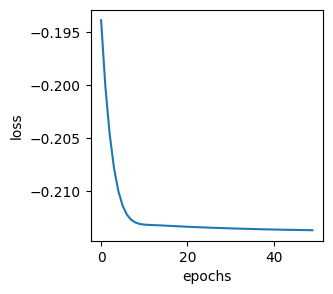

Start of epoch 0
step 0: mean loss 0.6979 ls 0.09 lr 0.009979999624192715
step 0: mean loss 0.6156 ls 0.06 lr 0.009870000183582306
step 0: mean loss 0.5395 ls 0.08 lr 0.009770000353455544
step 0: mean loss 0.4666 ls 0.07 lr 0.009669999592006207
step 0: mean loss 0.3964 ls 0.06 lr 0.009569999761879444
step 0: mean loss 0.3282 ls 0.07 lr 0.009469999931752682
step 0: mean loss 0.264 ls 0.06 lr 0.00937000010162592
step 0: mean loss 0.2041 ls 0.07 lr 0.009270000271499157
step 0: mean loss 0.1492 ls 0.07 lr 0.009170000441372395
step 0: mean loss 0.0981 ls 0.07 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss 0.0506 ls 0.07 lr 0.008980000391602516
step 0: mean loss 0.0073 ls 0.07 lr 0.0088900001719594
step 0: mean loss -0.034 ls 0.07 lr 0.008790000341832638
step 0: mean loss -0.0729 ls 0.08 lr 0.008700000122189522
step 0: mean loss -0.1099 ls 0.08 lr 0.008609999902546406
step 0: mean loss -0.1448 ls 0.08 lr 0.00851999968290329
step 0: mean loss -0.1772 ls 0.09 lr 0.0084300003945827

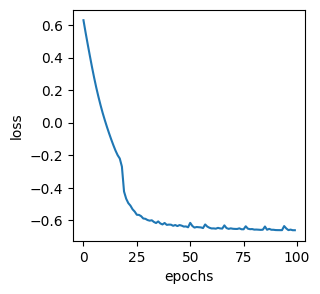

['135', '154', '155', '160', '179']


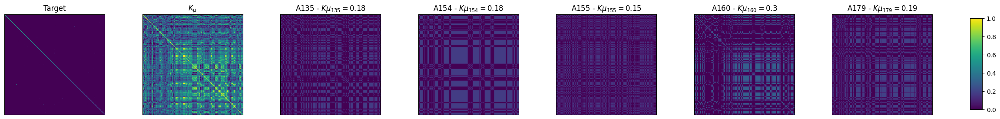

(307, 5)


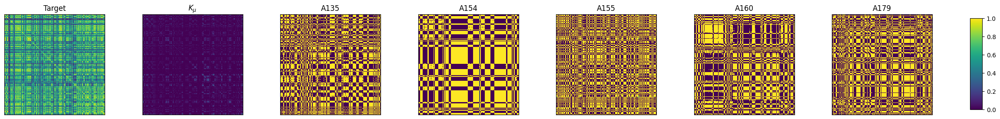

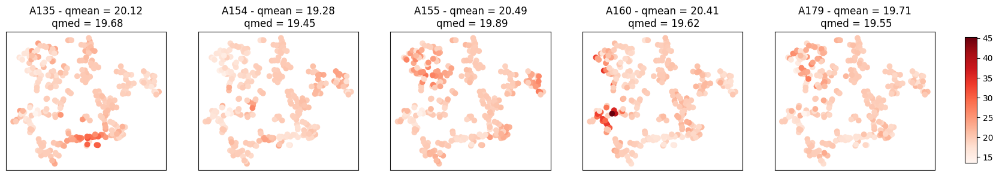

***********************************dulce***********************************


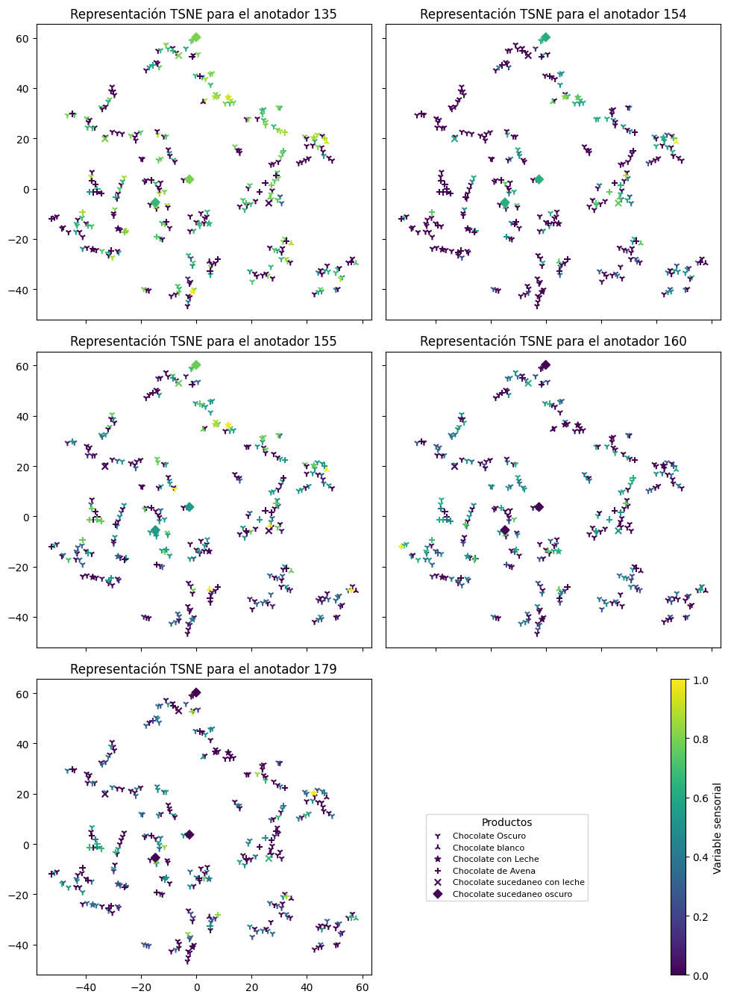

Start of epoch 0
step 0: mean loss -0.224 ls 0.01 lr 0.00989999994635582 mu [0.05 0.18 0.35 0.09 0.32]
Start of epoch 1
step 0: mean loss -0.2379 ls 0.01 lr 0.009390000253915787 mu [0.07 0.19 0.31 0.1  0.32]
Start of epoch 2
step 0: mean loss -0.2492 ls 0.01 lr 0.008910000324249268 mu [0.09 0.2  0.28 0.11 0.32]
Start of epoch 3
step 0: mean loss -0.2583 ls 0.01 lr 0.008449999615550041 mu [0.1  0.21 0.25 0.13 0.31]
Start of epoch 4
step 0: mean loss -0.2656 ls 0.01 lr 0.008019999600946903 mu [0.11 0.22 0.23 0.14 0.3 ]
Start of epoch 5
step 0: mean loss -0.2716 ls 0.01 lr 0.007600000128149986 mu [0.12 0.23 0.21 0.15 0.29]
Start of epoch 6
step 0: mean loss -0.2763 ls 0.01 lr 0.007209999952465296 mu [0.13 0.24 0.2  0.16 0.27]
Start of epoch 7
step 0: mean loss -0.2798 ls 0.01 lr 0.006839999929070473 mu [0.14 0.25 0.19 0.17 0.26]
Start of epoch 8
step 0: mean loss -0.2823 ls 0.01 lr 0.006490000057965517 mu [0.15 0.25 0.17 0.17 0.25]
Start of epoch 9
step 0: mean loss -0.2841 ls 0.01 lr 0.0

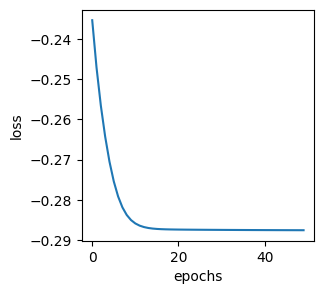

Start of epoch 0
step 0: mean loss 0.6939 ls 0.09 lr 0.009979999624192715
step 0: mean loss 0.6118 ls 0.06 lr 0.009870000183582306
step 0: mean loss 0.5364 ls 0.08 lr 0.009770000353455544
step 0: mean loss 0.4639 ls 0.07 lr 0.009669999592006207
step 0: mean loss 0.3933 ls 0.06 lr 0.009569999761879444
step 0: mean loss 0.324 ls 0.07 lr 0.009469999931752682
step 0: mean loss 0.257 ls 0.06 lr 0.00937000010162592
step 0: mean loss 0.1947 ls 0.07 lr 0.009270000271499157
step 0: mean loss 0.1372 ls 0.06 lr 0.009170000441372395
step 0: mean loss 0.0846 ls 0.07 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss 0.0356 ls 0.07 lr 0.008980000391602516
step 0: mean loss -0.0104 ls 0.07 lr 0.0088900001719594
step 0: mean loss -0.0533 ls 0.07 lr 0.008790000341832638
step 0: mean loss -0.0947 ls 0.08 lr 0.008700000122189522
step 0: mean loss -0.135 ls 0.09 lr 0.008609999902546406
step 0: mean loss -0.1749 ls 0.1 lr 0.00851999968290329
step 0: mean loss -0.2113 ls 0.12 lr 0.00843000039458274

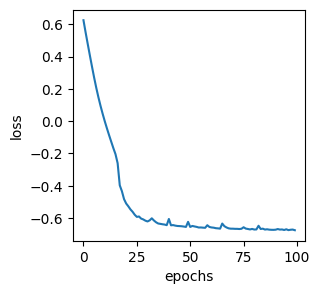

['135', '154', '155', '160', '179']


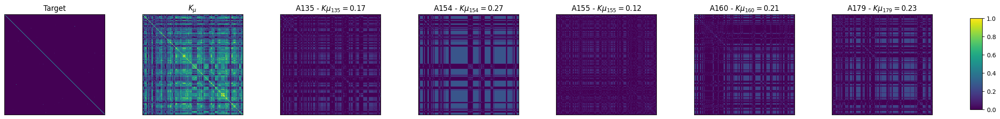

(307, 5)


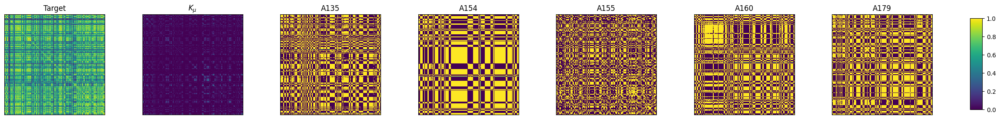

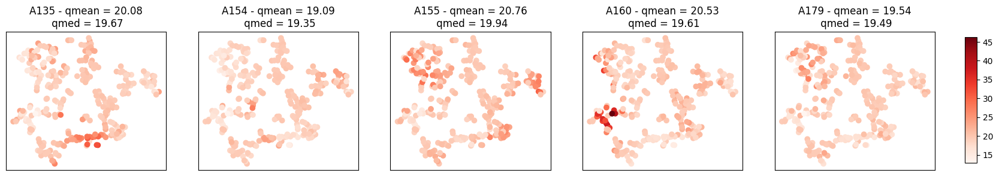

***********************************amargor***********************************


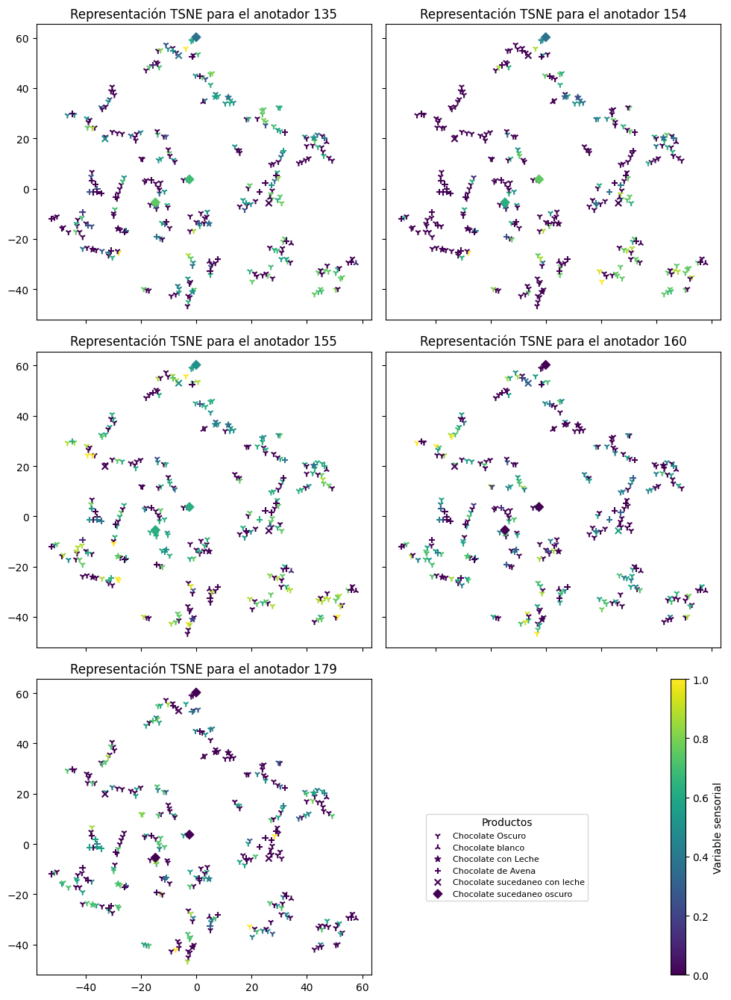

Start of epoch 0
step 0: mean loss -0.2726 ls 0.01 lr 0.00989999994635582 mu [0.1  0.29 0.14 0.31 0.17]
Start of epoch 1
step 0: mean loss -0.2777 ls 0.01 lr 0.009390000253915787 mu [0.11 0.28 0.15 0.28 0.18]
Start of epoch 2
step 0: mean loss -0.2813 ls 0.01 lr 0.008910000324249268 mu [0.12 0.27 0.16 0.27 0.19]
Start of epoch 3
step 0: mean loss -0.284 ls 0.01 lr 0.008449999615550041 mu [0.14 0.26 0.16 0.25 0.19]
Start of epoch 4
step 0: mean loss -0.2864 ls 0.01 lr 0.008019999600946903 mu [0.15 0.26 0.16 0.25 0.19]
Start of epoch 5
step 0: mean loss -0.2886 ls 0.01 lr 0.007600000128149986 mu [0.17 0.25 0.16 0.24 0.18]
Start of epoch 6
step 0: mean loss -0.2905 ls 0.01 lr 0.007209999952465296 mu [0.18 0.25 0.15 0.24 0.18]
Start of epoch 7
step 0: mean loss -0.2919 ls 0.01 lr 0.006839999929070473 mu [0.2  0.25 0.15 0.24 0.17]
Start of epoch 8
step 0: mean loss -0.293 ls 0.01 lr 0.006490000057965517 mu [0.21 0.24 0.14 0.23 0.17]
Start of epoch 9
step 0: mean loss -0.2938 ls 0.01 lr 0.00

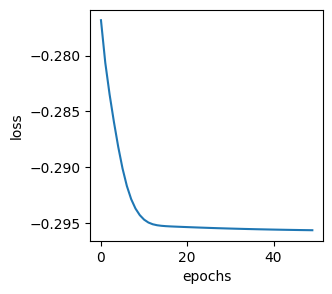

Start of epoch 0
step 0: mean loss 0.6775 ls 0.09 lr 0.009979999624192715
step 0: mean loss 0.5914 ls 0.05 lr 0.009870000183582306
step 0: mean loss 0.5153 ls 0.07 lr 0.009770000353455544
step 0: mean loss 0.444 ls 0.06 lr 0.009669999592006207
step 0: mean loss 0.3734 ls 0.05 lr 0.009569999761879444
step 0: mean loss 0.3045 ls 0.06 lr 0.009469999931752682
step 0: mean loss 0.24 ls 0.06 lr 0.00937000010162592
step 0: mean loss 0.18 ls 0.06 lr 0.009270000271499157
step 0: mean loss 0.1246 ls 0.06 lr 0.009170000441372395
step 0: mean loss 0.0738 ls 0.06 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss 0.0264 ls 0.06 lr 0.008980000391602516
step 0: mean loss -0.0179 ls 0.07 lr 0.0088900001719594
step 0: mean loss -0.0605 ls 0.07 lr 0.008790000341832638
step 0: mean loss -0.1023 ls 0.07 lr 0.008700000122189522
step 0: mean loss -0.1446 ls 0.08 lr 0.008609999902546406
step 0: mean loss -0.1863 ls 0.1 lr 0.00851999968290329
step 0: mean loss -0.2298 ls 0.11 lr 0.008430000394582748


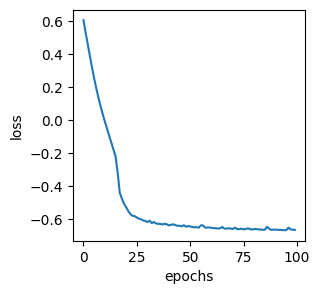

['135', '154', '155', '160', '179']


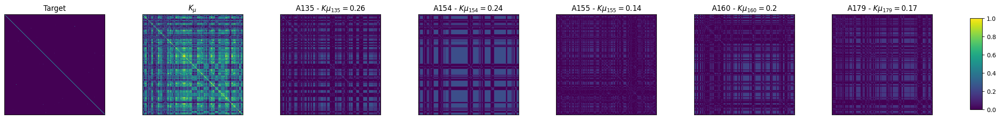

(307, 5)


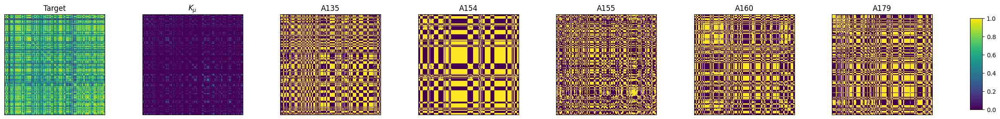

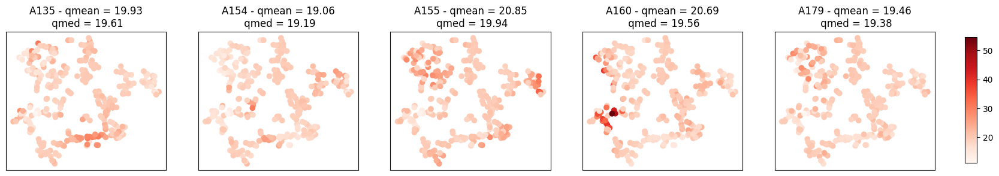

***********************************acidez***********************************


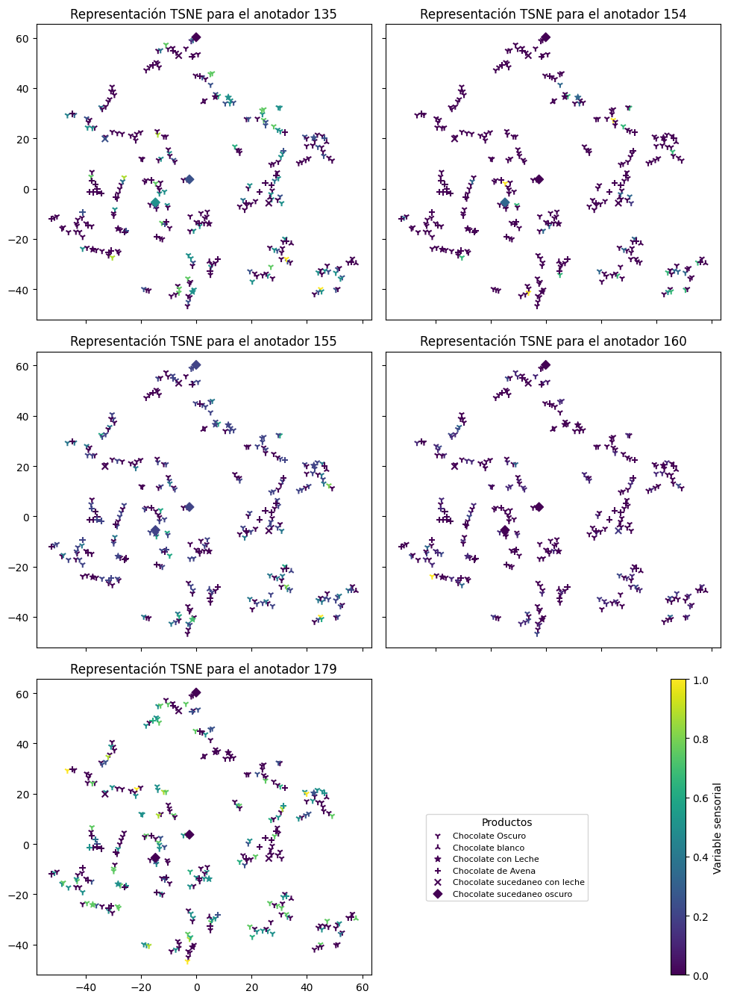

Start of epoch 0
step 0: mean loss -0.1781 ls 0.01 lr 0.00989999994635582 mu [0.1  0.36 0.25 0.05 0.25]
Start of epoch 1
step 0: mean loss -0.1948 ls 0.01 lr 0.009390000253915787 mu [0.13 0.31 0.2  0.08 0.28]
Start of epoch 2
step 0: mean loss -0.2053 ls 0.01 lr 0.008910000324249268 mu [0.16 0.27 0.16 0.11 0.29]
Start of epoch 3
step 0: mean loss -0.211 ls 0.01 lr 0.008449999615550041 mu [0.19 0.24 0.14 0.14 0.29]
Start of epoch 4
step 0: mean loss -0.2137 ls 0.01 lr 0.008019999600946903 mu [0.21 0.21 0.13 0.16 0.28]
Start of epoch 5
step 0: mean loss -0.2149 ls 0.01 lr 0.007600000128149986 mu [0.23 0.19 0.14 0.18 0.27]
Start of epoch 6
step 0: mean loss -0.2151 ls 0.01 lr 0.007209999952465296 mu [0.24 0.17 0.15 0.18 0.26]
Start of epoch 7
step 0: mean loss -0.2149 ls 0.01 lr 0.006839999929070473 mu [0.24 0.17 0.15 0.19 0.25]
Start of epoch 8
step 0: mean loss -0.2148 ls 0.01 lr 0.006490000057965517 mu [0.25 0.16 0.16 0.18 0.25]
Start of epoch 9
step 0: mean loss -0.2149 ls 0.01 lr 0.0

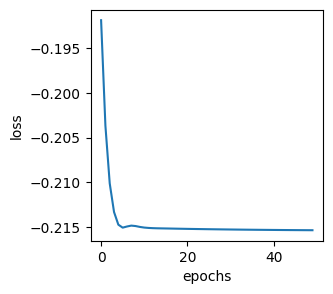

Start of epoch 0
step 0: mean loss 0.6861 ls 0.09 lr 0.009979999624192715
step 0: mean loss 0.6007 ls 0.05 lr 0.009870000183582306
step 0: mean loss 0.5239 ls 0.07 lr 0.009770000353455544
step 0: mean loss 0.4528 ls 0.06 lr 0.009669999592006207
step 0: mean loss 0.3831 ls 0.05 lr 0.009569999761879444
step 0: mean loss 0.3151 ls 0.06 lr 0.009469999931752682
step 0: mean loss 0.2508 ls 0.06 lr 0.00937000010162592
step 0: mean loss 0.1911 ls 0.06 lr 0.009270000271499157
step 0: mean loss 0.1358 ls 0.06 lr 0.009170000441372395
step 0: mean loss 0.0849 ls 0.06 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss 0.0361 ls 0.06 lr 0.008980000391602516
step 0: mean loss -0.0098 ls 0.07 lr 0.0088900001719594
step 0: mean loss -0.0539 ls 0.07 lr 0.008790000341832638
step 0: mean loss -0.097 ls 0.07 lr 0.008700000122189522
step 0: mean loss -0.141 ls 0.08 lr 0.008609999902546406
step 0: mean loss -0.189 ls 0.09 lr 0.00851999968290329
step 0: mean loss -0.2371 ls 0.1 lr 0.00843000039458274

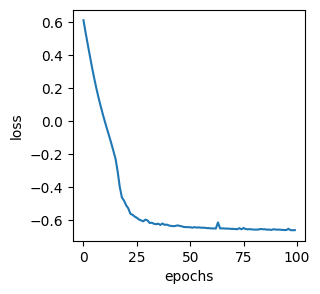

['135', '154', '155', '160', '179']


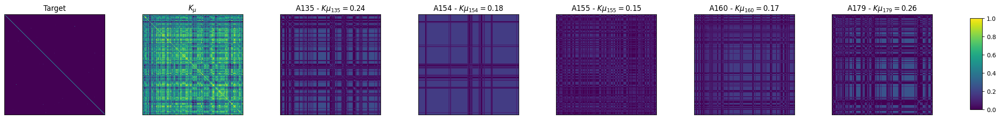

(307, 5)


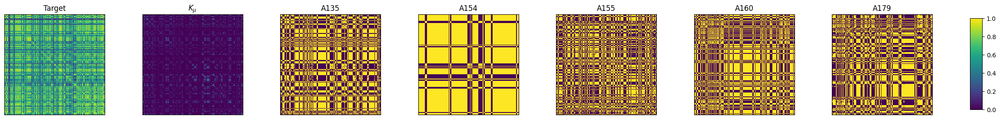

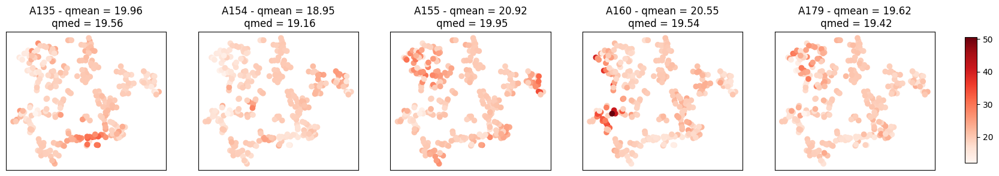

***********************************astringencia***********************************


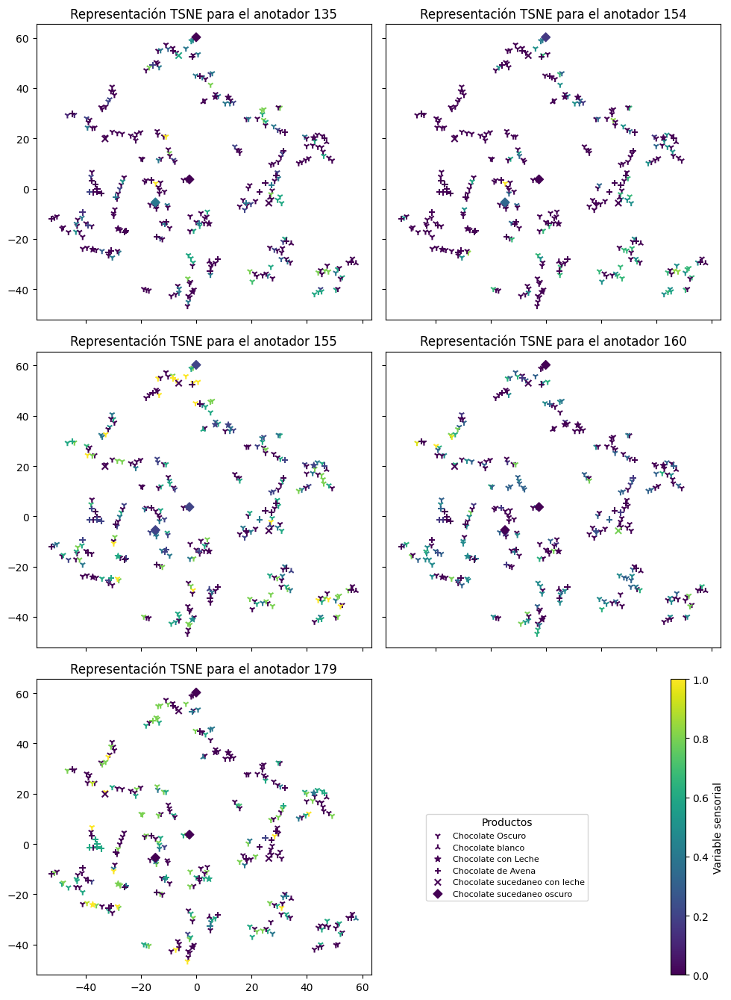

Start of epoch 0
step 0: mean loss -0.245 ls 0.01 lr 0.00989999994635582 mu [0.1  0.21 0.17 0.29 0.23]
Start of epoch 1
step 0: mean loss -0.2503 ls 0.01 lr 0.009390000253915787 mu [0.11 0.22 0.19 0.27 0.2 ]
Start of epoch 2
step 0: mean loss -0.2534 ls 0.01 lr 0.008910000324249268 mu [0.13 0.24 0.2  0.25 0.19]
Start of epoch 3
step 0: mean loss -0.2552 ls 0.01 lr 0.008449999615550041 mu [0.15 0.25 0.19 0.23 0.17]
Start of epoch 4
step 0: mean loss -0.2561 ls 0.01 lr 0.008019999600946903 mu [0.16 0.26 0.18 0.22 0.17]
Start of epoch 5
step 0: mean loss -0.2565 ls 0.01 lr 0.007600000128149986 mu [0.17 0.27 0.18 0.22 0.17]
Start of epoch 6
step 0: mean loss -0.2566 ls 0.01 lr 0.007209999952465296 mu [0.18 0.27 0.17 0.21 0.17]
Start of epoch 7
step 0: mean loss -0.2567 ls 0.01 lr 0.006839999929070473 mu [0.19 0.26 0.17 0.21 0.17]
Start of epoch 8
step 0: mean loss -0.2567 ls 0.01 lr 0.006490000057965517 mu [0.19 0.26 0.18 0.21 0.17]
Start of epoch 9
step 0: mean loss -0.2568 ls 0.01 lr 0.0

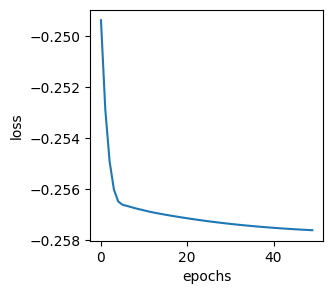

Start of epoch 0
step 0: mean loss 0.6836 ls 0.09 lr 0.009979999624192715
step 0: mean loss 0.5989 ls 0.05 lr 0.009870000183582306
step 0: mean loss 0.5243 ls 0.07 lr 0.009770000353455544
step 0: mean loss 0.4549 ls 0.06 lr 0.009669999592006207
step 0: mean loss 0.385 ls 0.05 lr 0.009569999761879444
step 0: mean loss 0.315 ls 0.06 lr 0.009469999931752682
step 0: mean loss 0.2477 ls 0.05 lr 0.00937000010162592
step 0: mean loss 0.1842 ls 0.06 lr 0.009270000271499157
step 0: mean loss 0.124 ls 0.05 lr 0.009170000441372395
step 0: mean loss 0.0662 ls 0.06 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss 0.0087 ls 0.06 lr 0.008980000391602516
step 0: mean loss -0.0486 ls 0.06 lr 0.0088900001719594
step 0: mean loss -0.1048 ls 0.06 lr 0.008790000341832638
step 0: mean loss -0.1639 ls 0.07 lr 0.008700000122189522
step 0: mean loss -0.228 ls 0.09 lr 0.008609999902546406
step 0: mean loss -0.2936 ls 0.1 lr 0.00851999968290329
step 0: mean loss -0.4095 ls 0.15 lr 0.008430000394582748

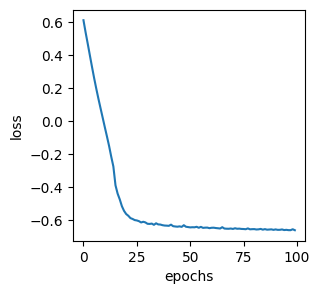

['135', '154', '155', '160', '179']


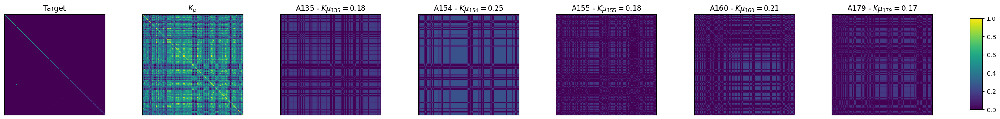

(307, 5)


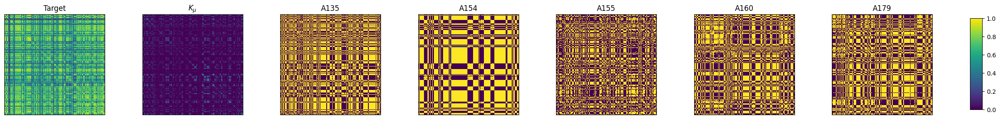

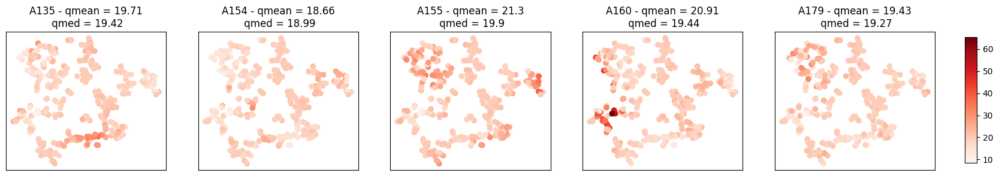

***********************************velocidad fusion***********************************


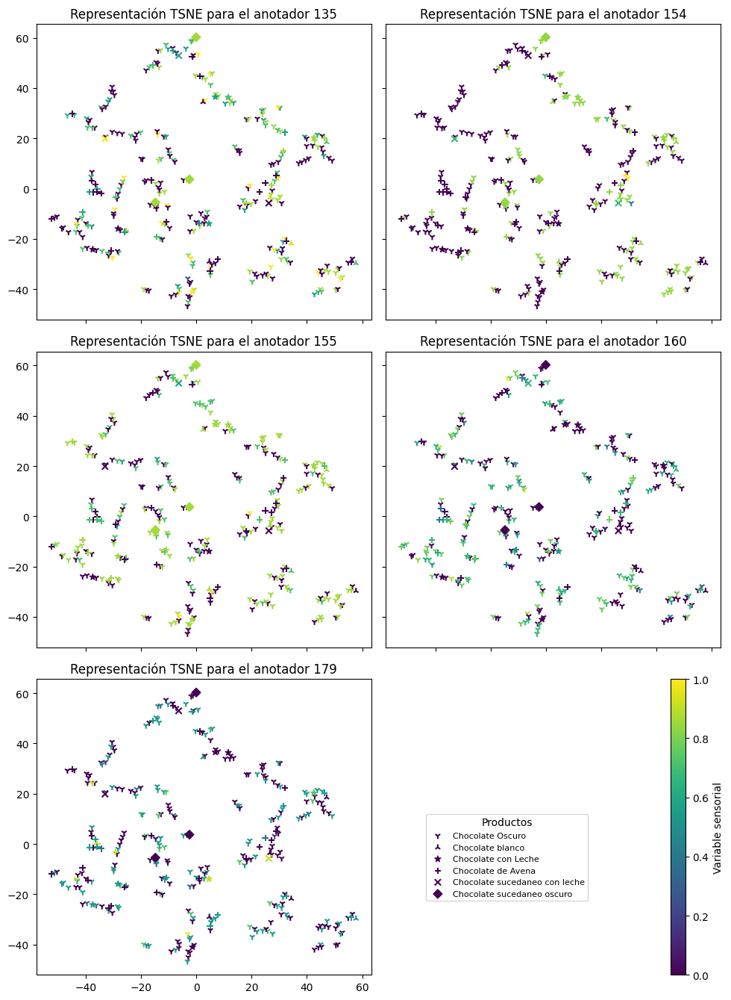

Start of epoch 0
step 0: mean loss -0.1813 ls 0.01 lr 0.00989999994635582 mu [0.23 0.02 0.31 0.24 0.2 ]
Start of epoch 1
step 0: mean loss -0.1865 ls 0.01 lr 0.009390000253915787 mu [0.24 0.04 0.28 0.25 0.2 ]
Start of epoch 2
step 0: mean loss -0.1904 ls 0.01 lr 0.008910000324249268 mu [0.24 0.05 0.25 0.25 0.21]
Start of epoch 3
step 0: mean loss -0.1933 ls 0.01 lr 0.008449999615550041 mu [0.25 0.06 0.23 0.26 0.2 ]
Start of epoch 4
step 0: mean loss -0.1954 ls 0.01 lr 0.008019999600946903 mu [0.25 0.07 0.22 0.26 0.2 ]
Start of epoch 5
step 0: mean loss -0.197 ls 0.01 lr 0.007600000128149986 mu [0.26 0.08 0.2  0.27 0.19]
Start of epoch 6
step 0: mean loss -0.1981 ls 0.01 lr 0.007209999952465296 mu [0.26 0.09 0.19 0.27 0.19]
Start of epoch 7
step 0: mean loss -0.1988 ls 0.01 lr 0.006839999929070473 mu [0.26 0.09 0.18 0.28 0.18]
Start of epoch 8
step 0: mean loss -0.1993 ls 0.01 lr 0.006490000057965517 mu [0.26 0.1  0.18 0.28 0.18]
Start of epoch 9
step 0: mean loss -0.1996 ls 0.01 lr 0.0

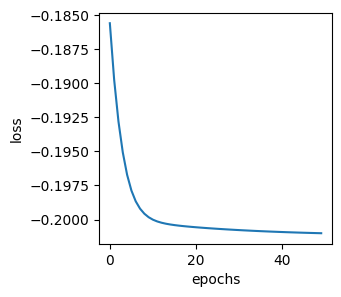

Start of epoch 0
step 0: mean loss 0.6806 ls 0.09 lr 0.009979999624192715
step 0: mean loss 0.5961 ls 0.06 lr 0.009870000183582306
step 0: mean loss 0.5194 ls 0.07 lr 0.009770000353455544
step 0: mean loss 0.4479 ls 0.07 lr 0.009669999592006207
step 0: mean loss 0.3779 ls 0.06 lr 0.009569999761879444
step 0: mean loss 0.3091 ls 0.07 lr 0.009469999931752682
step 0: mean loss 0.2444 ls 0.06 lr 0.00937000010162592
step 0: mean loss 0.183 ls 0.06 lr 0.009270000271499157
step 0: mean loss 0.1259 ls 0.06 lr 0.009170000441372395
step 0: mean loss 0.0729 ls 0.07 lr 0.009080000221729279
Start of epoch 10
step 0: mean loss 0.0212 ls 0.07 lr 0.008980000391602516
step 0: mean loss -0.0305 ls 0.07 lr 0.0088900001719594
step 0: mean loss -0.0826 ls 0.07 lr 0.008790000341832638
step 0: mean loss -0.1394 ls 0.08 lr 0.008700000122189522
step 0: mean loss -0.2055 ls 0.09 lr 0.008609999902546406
step 0: mean loss -0.2575 ls 0.11 lr 0.00851999968290329
step 0: mean loss -0.3266 ls 0.14 lr 0.00843000039458

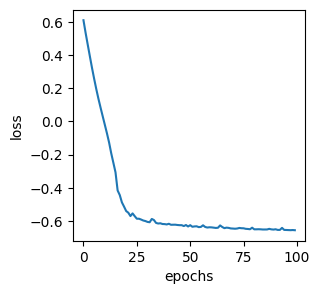

['135', '154', '155', '160', '179']


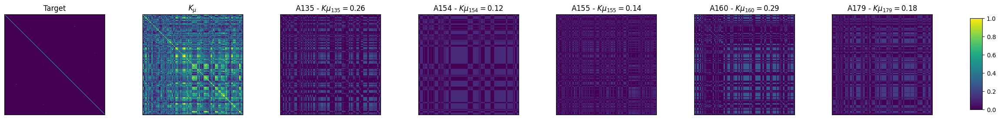

(307, 5)


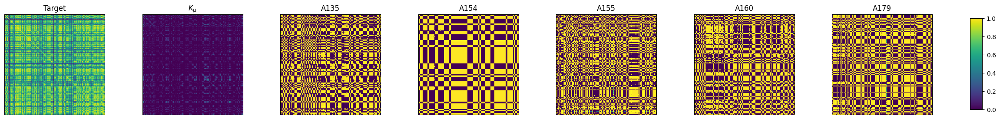

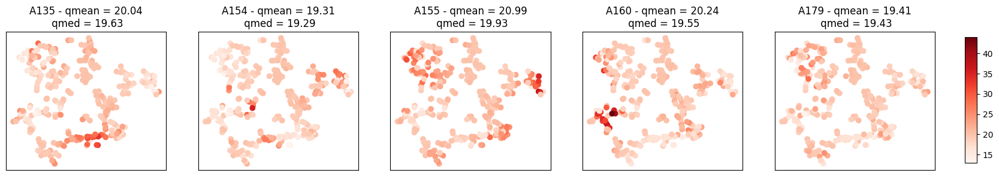

In [ ]:
df_vars, df_ma2, anotadores = create_dfs(df_comb.copy(), fq_variables, variables, 5, 'all')
valid_humidity = df_vars['humedad - determinador halogeno'] <= 1
df_vars, df_ma2 = df_vars[valid_humidity], df_ma2[valid_humidity]

scaler_X = MinMaxScaler()
X = scaler_X.fit_transform(df_vars.values)

df_fq2 = df_fq.set_index('CodMuestra')
dict_mstr_subm = {idx : df_fq2.loc[idx, 'SubMatriz'] for idx in df_ma2.index}
productos = pd.Series([dict_mstr_subm[idx] for idx in df_ma2.index])
productos_unicos = productos.unique()
markers = ["1", "2", "*", "+", "x", "D", ".", "s", "d"]

models_CKA2 = {}
models_LCKA2 = {}
for var in variables:
    print('*'*35 + var + '*'*35)
    df_ma = df_ma2[var]
    anotadores = lista_ann
    df_ma = df_ma.loc[:, anotadores]
    scaler_y = MinMaxScaler()
    y = scaler_y.fit_transform(df_ma.values)
    iAnn = get_iAnn(y)
    y = np.nan_to_num(y)
    X_red = plot_MA_red(X, y, anotadores, markers, productos, productos_unicos, method='tsne')
    if var == variables[0]:
        labels = plot_clusters(X_red, productos)
        plot_kde_clusters(df_vars, labels)
    model_CKA = CKA(batch_size=len(iAnn),iAnn=iAnn,lr=1e-2)
    model_CKA.fit(X,y)
    model_CKA.plot_history()
    # models_CKA[var] = model_CKA
    model_LCKA = LCKA(batch_size=len(iAnn),iAnn=iAnn,lr=1e-2,epochs=100)
    model_LCKA.fit(X,y)
    # models_LCKA[var] = model_LCKA
    model_LCKA.plot_history()
    print(anotadores)
    model_CKA.plot_kernels(X, y, iAnn, anotadores)
    q = model_LCKA.plot_kernels(X, y, iAnn, anotadores)
    model_LCKA.plot_lckaQ(X,q, redlcka = 'tsne',random_state = 123,n_neighbors=10,cmap='Reds',annotators=anotadores)
    models_CKA2[var] = model_CKA
    models_LCKA2[var] = model_LCKA

# Save models

In [ ]:
models = [models_CKA, models_CKA2]
folders = ['individual', 'joint']
for i in range(len(models)):
    for var in variables:
        model = models[i][var]
        dict_model = {}
        dict_model['mu'] = model.mu.numpy()
        dict_model['loss_'] = model.loss_
        dict_model['ls_X'] = model.ls_X.numpy()
        dict_model['ls_Y'] = model.ls_Y.numpy()
        with open(f'/content/python-gcpds.luker_multiple_annotators/models/5subset_1/{folders[i]}/CKA_{var}.pkl', "wb") as f:
            pickle.dump(dict_model, f)

models = [models_LCKA, models_LCKA2]
folders = ['individual', 'joint']
for i in range(len(models)):
    for var in variables:
        model = models[i][var]
        dict_model = {}
        dict_model['q'] = model.q
        dict_model['loss_'] = model.loss_
        dict_model['ls_X'] = model.ls_X.numpy()
        dict_model['ls_Y'] = model.ls_Y.numpy()
        dict_model['beta'] = model.beta.numpy()
        with open(f'/content/python-gcpds.luker_multiple_annotators/models/5subset_1/{folders[i]}/LCKA_{var}.pkl', "wb") as f:
            pickle.dump(dict_model, f)

In [ ]:
# !zip -r /content/file.zip /content/python-gcpds.luker_multiple_annotators/models

  adding: content/python-gcpds.luker_multiple_annotators/models/ (stored 0%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/ (stored 0%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/CKA_aroma.pkl (deflated 8%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/LCKA_amargor.pkl (deflated 24%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/LCKA_astringencia.pkl (deflated 24%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/CKA_velocidad fusion.pkl (deflated 7%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/LCKA_aroma.pkl (deflated 24%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/CKA_acidez.pkl (deflated 9%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/LCKA_velocidad fusion.pkl (deflated 24%)
  adding: content/python-gcpds.luker_multiple_annotators/models/joint/CKA_amargor.pkl (deflated 9%)
  adding: cont

# Load models

In [6]:
models_CKA = {}
models_LCKA = {}
models_CKA2 = {}
models_LCKA2 = {}
folder = ['individual', 'joint']
variables = ['aroma', 'dulce', 'amargor', 'acidez', 'astringencia', 'velocidad fusion']

In [9]:
models = [models_CKA, models_CKA2]
folders = ['individual', 'joint']
for i in range(len(models)):
    for var in variables:
        with open(f'/content/python-gcpds.luker_multiple_annotators/models/5subset_1/{folders[i]}/CKA_{var}.pkl', "rb") as f:
            loaded_model = pickle.load(f)
        model = CKA()
        model.mu = tf.Variable(loaded_model['mu'], dtype=tf.float64)
        model.ls_X = tf.Variable(loaded_model['ls_X'], dtype=tf.float64)
        model.ls_Y = tf.Variable(loaded_model['ls_Y'], dtype=tf.float64)
        model.loss_ = loaded_model['loss_']
        models[i][var] = model

models = [models_LCKA, models_LCKA2]
folders = ['individual', 'joint']
for i in range(len(models)):
    for var in variables:
        with open(f'/content/python-gcpds.luker_multiple_annotators/models/5subset_1/{folders[i]}/LCKA_{var}.pkl', "rb") as f:
            loaded_model = pickle.load(f)
        model = LCKA()
        model.beta = tf.Variable(loaded_model['beta'], dtype=tf.float64)
        model.ls_X = tf.Variable(loaded_model['ls_X'], dtype=tf.float64)
        model.ls_Y = tf.Variable(loaded_model['ls_Y'], dtype=tf.float64)
        model.loss_ = loaded_model['loss_']
        model.q = loaded_model['q']
        models[i][var] = model

# Export results

In [14]:
df_vars, df_ma2, anotadores = create_dfs(df_comb.copy(), fq_variables, variables, 5, 'all')
valid_humidity = df_vars['humedad - determinador halogeno'] <= 1
df_vars, df_ma2 = df_vars[valid_humidity], df_ma2[valid_humidity]

dfs_q = []
for var in variables:
    idx = [f'Relev {var}-{ann}' for ann in lista_ann]
    df = pd.DataFrame(softmax(models_LCKA2[var].q**2, axis=1), columns=idx)
    dfs_q.append(df)
df_relev = pd.concat(dfs_q, axis=1)
df_relev.index = df_vars.index
df_relev

,Relev aroma-135,Relev aroma-154,Relev aroma-155,Relev aroma-160,Relev aroma-179,Relev dulce-135,Relev dulce-154,Relev dulce-155,Relev dulce-160,Relev dulce-179,...,Relev astringencia-135,Relev astringencia-154,Relev astringencia-155,Relev astringencia-160,Relev astringencia-179,Relev velocidad fusion-135,Relev velocidad fusion-154,Relev velocidad fusion-155,Relev velocidad fusion-160,Relev velocidad fusion-179
codigo sampler,,,,,,,,,,,,,,,,,,,,,
D01221695,0.192561,0.194493,0.237776,0.187585,0.187585,0.196820,0.195419,0.231072,0.188344,0.188344,...,0.187147,0.189850,0.256086,0.183458,0.183458,0.196731,0.194930,0.226285,0.191027,0.191027
D01221946,0.192586,0.214395,0.224271,0.184374,0.184374,0.190271,0.207038,0.238223,0.182234,0.182234,...,0.190697,0.215373,0.241989,0.175970,0.175970,0.193683,0.217174,0.243243,0.172950,0.172950
D01221978,0.212123,0.186085,0.215954,0.176344,0.209495,0.206136,0.181625,0.234321,0.173301,0.204617,...,0.223853,0.176813,0.232315,0.161641,0.205378,0.221213,0.179169,0.234080,0.161595,0.203943
D01222198,0.246962,0.166892,0.214491,0.165846,0.205809,0.240009,0.162609,0.235052,0.161619,0.200711,...,0.269892,0.146622,0.240311,0.143785,0.199389,0.264304,0.152056,0.236807,0.148570,0.198264
D01222283,0.206007,0.197187,0.202043,0.195314,0.199448,0.210291,0.196033,0.199062,0.195127,0.199487,...,0.202174,0.195264,0.208278,0.192804,0.201479,0.204715,0.201457,0.199567,0.196364,0.197897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F12230552,0.192633,0.192633,0.229468,0.192633,0.192633,0.193456,0.193456,0.226178,0.193456,0.193456,...,0.186445,0.186445,0.254219,0.186445,0.186445,0.194553,0.194553,0.221790,0.194553,0.194553
F12232202,0.173583,0.173583,0.242007,0.179548,0.231279,0.173548,0.173548,0.236741,0.179999,0.236164,...,0.155984,0.155984,0.271938,0.164910,0.251184,0.172721,0.172721,0.244175,0.181222,0.229160
G01232116,0.218433,0.171852,0.216498,0.171852,0.221366,0.214715,0.168974,0.233560,0.168974,0.213777,...,0.217738,0.151733,0.244506,0.151733,0.234290,0.220155,0.164608,0.238853,0.164608,0.211776


In [15]:
dict_matriz_smatriz = df_fq.loc[:,['CodMuestra', 'Matriz', 'SubMatriz']].set_index('CodMuestra').to_dict()
df_final = pd.concat((df_vars, df_ma2, df_relev), axis=1)
df_final['Matriz'] = df_final.index.map(dict_matriz_smatriz['Matriz'])
df_final['SubMatriz'] = df_final.index.map(dict_matriz_smatriz['SubMatriz'])
df_final = df_final[['Matriz', 'SubMatriz'] + [col for col in df_final.columns if col not in ['Matriz', 'SubMatriz']]]
df_final

,Matriz,SubMatriz,granulometría - micrometro,grasa - nmr,humedad - determinador halogeno,limite de fluidez anton paar,viscosidad plastica anton paar,"(acidez, 135)","(acidez, 154)","(acidez, 155)",...,Relev astringencia-135,Relev astringencia-154,Relev astringencia-155,Relev astringencia-160,Relev astringencia-179,Relev velocidad fusion-135,Relev velocidad fusion-154,Relev velocidad fusion-155,Relev velocidad fusion-160,Relev velocidad fusion-179
codigo sampler,,,,,,,,,,,,,,,,,,,,,
D01221695,Chocolate,Chocolate Oscuro / Dark Chocolate,20.0,32.8122,0.16,18.8280,1.7214,2.0,2.0,3.0,...,0.187147,0.189850,0.256086,0.183458,0.183458,0.196731,0.194930,0.226285,0.191027,0.191027
D01221946,Chocolate,Chocolate blanco / White chocolate,25.0,41.0745,0.28,2.1108,1.7129,0.0,0.0,1.0,...,0.190697,0.215373,0.241989,0.175970,0.175970,0.193683,0.217174,0.243243,0.172950,0.172950
D01221978,Chocolate,Chocolate con Leche / Milk chocolate,24.0,36.1987,0.29,10.3100,1.4130,1.0,0.0,1.0,...,0.223853,0.176813,0.232315,0.161641,0.205378,0.221213,0.179169,0.234080,0.161595,0.203943
D01222198,Chocolate,Chocolate Oscuro / Dark Chocolate,24.0,32.9007,0.31,14.7380,1.7866,2.0,0.0,1.0,...,0.269892,0.146622,0.240311,0.143785,0.199389,0.264304,0.152056,0.236807,0.148570,0.198264
D01222283,Chocolate,Chocolate Oscuro / Dark Chocolate,25.0,40.3796,0.19,5.0631,2.0953,1.0,0.0,1.0,...,0.202174,0.195264,0.208278,0.192804,0.201479,0.204715,0.201457,0.199567,0.196364,0.197897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F12230552,Chocolate,Chocolate Oscuro / Dark Chocolate,25.0,36.7312,0.16,10.0140,2.1597,NaN,NaN,3.0,...,0.186445,0.186445,0.254219,0.186445,0.186445,0.194553,0.194553,0.221790,0.194553,0.194553
F12232202,Chocolate,Chocolate con Leche / Milk chocolate,20.0,39.8689,0.13,2.5086,0.8218,NaN,NaN,1.0,...,0.155984,0.155984,0.271938,0.164910,0.251184,0.172721,0.172721,0.244175,0.181222,0.229160
G01232116,Chocolate,Chocolate Oscuro / Dark Chocolate,29.0,42.6941,0.09,6.6960,1.4330,2.0,NaN,1.0,...,0.217738,0.151733,0.244506,0.151733,0.234290,0.220155,0.164608,0.238853,0.164608,0.211776


In [16]:
df_final.to_csv('/content/python-gcpds.luker_multiple_annotators/results/output_table_joint_lcka_5subset_1.csv')